In [1]:
# ------ Imports -----
import pandas as pd
import numpy as np
import random
import seaborn as sns
from utils import get_dfs

# - Data handling -
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler


# - Hopkins Stats - 
from sklearn.neighbors import NearestNeighbors

# - Plotting -
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples

# - K-means -
from sklearn.cluster import k_means

# - GMM -
from sklearn.mixture import GaussianMixture

# - HACG -
from sklearn.cluster import AgglomerativeClustering

# - OPTICS - 
from sklearn.cluster import OPTICS

In [2]:
# ----- Initialize Data -----

data_df, audio_features_df, holdout_df = get_dfs()

# Drop mode, key?
audio_features_df.describe()  
audio_features_df = audio_features_df.drop(columns=["mode", "key", "loudness", "duration_ms", "track_popularity"])
print(audio_features_df.keys())
audio_features_df.describe()  

Index(['danceability', 'energy', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo'],
      dtype='object')


/Users/maltejohnsen/Mit drev/Software Design/3rd Semester/Data Mining/DataMiningExam/DataMining/utils.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['track_album_release_date'] = pd.to_datetime(
/Users/maltejohnsen/Mit drev/Software Design/3rd Semester/Data Mining/DataMiningExam/DataMining/utils.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year'] = df['track_album_release_date'].dt.year


,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,22681.000000,22681.000000,22681.000000,22681.000000,22681.000000,22681.000000,22681.000000,22681.000000
mean,0.653424,0.699527,0.107767,0.176563,0.090900,0.190702,0.510597,121.078796
std,0.145440,0.182664,0.102739,0.221848,0.232313,0.156102,0.234033,26.955131
min,0.000000,0.000175,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.561000,0.580000,0.040900,0.014300,0.000000,0.092500,0.329000,99.985000
50%,0.670000,0.723000,0.062300,0.079600,0.000021,0.127000,0.512000,121.998000
75%,0.760000,0.843000,0.133000,0.260000,0.006480,0.247000,0.694000,133.989000
max,0.983000,1.000000,0.918000,0.992000,0.994000,0.996000,0.991000,220.252000


In [3]:
def hopkins_statistic(X):
    # Change to Numpy array
    X = np.array(X)

    # Fix size variables
    rows, columns = X.shape[0], X.shape[1]
    sample_size = int(0.1*rows)

    # Determine samples (10% of data)
    sample_indices = random.sample(range(rows), sample_size)

    # Init nearest neighbor search object
    nearest_neighbors = NearestNeighbors(n_neighbors=1).fit(X)

    # Calculate nearest neighbor distances for q in Q (uniform random samples in X-space) and p in Q (samples from X)
    p_distances = []
    q_distances = []

    # Determine data boundaries
    min_values = np.amin(X, axis=0)
    max_values = np.amax(X, axis=0)

    for i in range(sample_size):
        
        p = X[sample_indices[i]]

        # Create random point
        q = np.random.uniform(low=min_values, high=max_values)
        
        # Pick second neighbor for P, because p is its own nearest neighbor
        p_neighbor_dist = nearest_neighbors.kneighbors(X=[p], n_neighbors=2, return_distance=True)[0][0,1]
        q_neighbor_dist = nearest_neighbors.kneighbors(X=[q], n_neighbors=1, return_distance=True)[0][0,0]

        p_distances.append(p_neighbor_dist)
        q_distances.append(q_neighbor_dist)

    # Calculate actual Hopkins measure. 0.5 is uniform distribution (no inherent clustering), 1.0 is highly clustered
    # If q_distances are much larger than p_distances (which is expected if p is clustered and q is uniform), then the value approaches 1.
    H = sum(p_distances)/(sum(p_distances) + sum(q_distances))

    return H

In [4]:
transformer = StandardScaler()
scaled_audio_features = transformer.fit_transform(audio_features_df)
print("Hopkins score:", hopkins_statistic(scaled_audio_features))

Hopkins score: 0.15423332780192706


In [5]:
# ------            Method for plotting clustering + silhouette chart             -------

def plot_cluster_silhouette(X, labels, nclusters, title):

    plt.clf()

    avg_score = np.round(silhouette_score(X=X, labels=labels), 5)

    silhouette_scores = silhouette_samples(X=X, labels=labels)

    # 2 rows, 1 col plot
    superplot, (plot1, plot2) = plt.subplots(1, 2)
    plt.suptitle(title)
    superplot.set_figheight(7)
    superplot.set_figwidth(16)
    
    y_lower = 100
    for i in range(nclusters):

        # Get silhoutte values for each sample belonging to cluster i
        cluster_i_samples = silhouette_scores[labels == i]
        cluster_i_samples.sort()
        type(cluster_i_samples)
        n_samples = cluster_i_samples.shape[0]

        # Upper y-axis limit for plot
        y_upper = y_lower + n_samples

        # Fill y coordinates in the y-range and add scores of cluster i to plot
        cluster_color = plt.cm.rainbow(float(i/nclusters))
        y_coordinates = np.arange(y_lower, y_upper)
        plot2.fill_betweenx(y=y_coordinates, x1=0, x2=cluster_i_samples, color=cluster_color, label=f'Cluster {i}')
        
        # Updates y-range + space between
        y_lower = y_upper + 100

    # Plot the vertical line, showing the avg. silhouette score
    plot2.axvline(x=avg_score, color="red")
    plot2.set_yticks([])
    plot2.set_ylabel("Clusterings")
    plot2.set_xlim([-0.3,1.0])
    plot2.set_xlabel(f"Silhouette coefficients, avg. = {avg_score}")
    plot2.set_title("Silhouette chart of clustering")
    

    # Transform data into 2-d for plottable represenation with PCA
    if X.shape[1] > 2:
        # Transform to 2-d with PCA
        pca_model = PCA(n_components=2)
        X = pca_model.fit_transform(X)

        # Transform to 2-d with t-SNE (SLOW)
        # tsne_data = TSNE(n_components=2, perplexity=50, n_iter=5000)
        # X = tsne_data.fit_transform(X=X)
    
    
    # Plot clustering
    colormap = plt.cm.rainbow(labels.astype(float) / nclusters)
    plot1.set_title(f"Clustering of {nclusters} clusters (2-component PCA-space)")
    plot1.scatter(X[:,0], X[:,1], c=colormap)
    plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

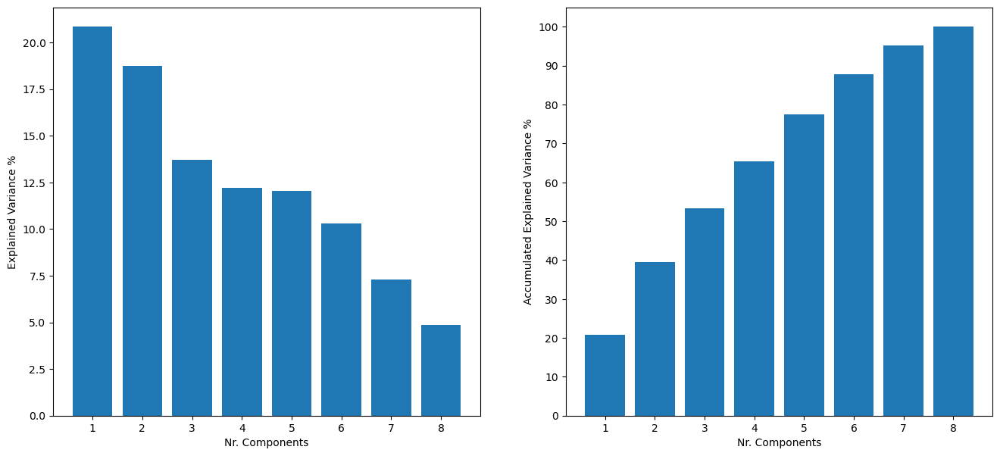

In [6]:
# ------------ PCA-Reduction ----------- 

# Transform to 2 dimensions with PCA
transformer = StandardScaler()
scaled_audio_features = transformer.fit_transform(audio_features_df)

superplot, (plot1, plot2) = plt.subplots(1, 2)
superplot.set_figheight(7)
superplot.set_figwidth(16)

# Plot explained variance per component
pca_model = PCA()
pca_transformed_data = pca_model.fit(X=scaled_audio_features)
nrcomponents = range(1, pca_transformed_data.n_components_ +1)
variance_ratios = pca_transformed_data.explained_variance_ratio_ * 100
plot1.bar(nrcomponents, variance_ratios)
plot1.set_ylabel("Explained Variance %")
plot1.set_xlabel("Nr. Components")
plot1.set_xticks(nrcomponents)

# Plot accumulated explained variance per component
cumulative_explained_var = variance_ratios.cumsum()
plot2.bar(nrcomponents, cumulative_explained_var)
plot2.set_ylabel("Accumulated Explained Variance %")
plot2.set_xlabel("Nr. Components")
plot2.set_yticks(range(0,101,10))
plot2.set_xticks(nrcomponents)

plt.show

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of

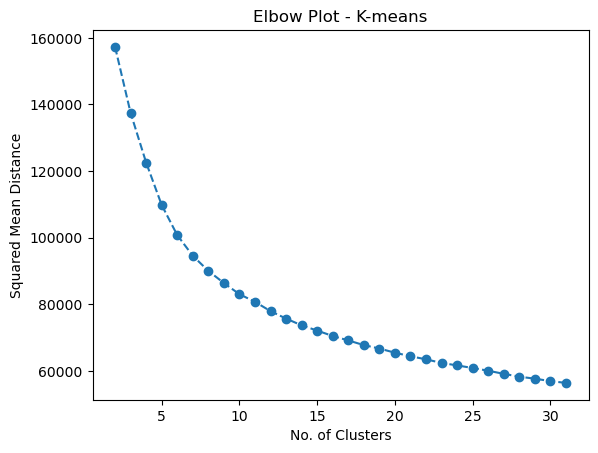

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

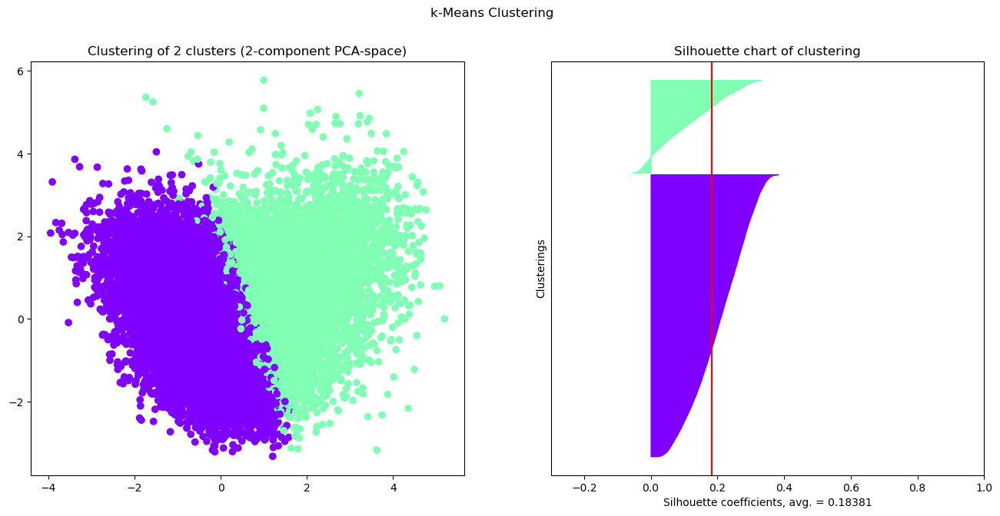

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

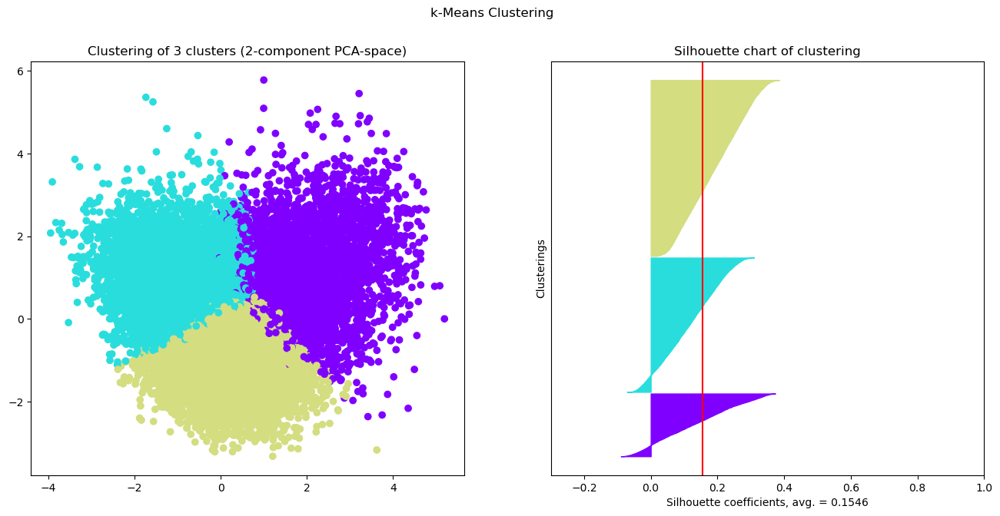

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

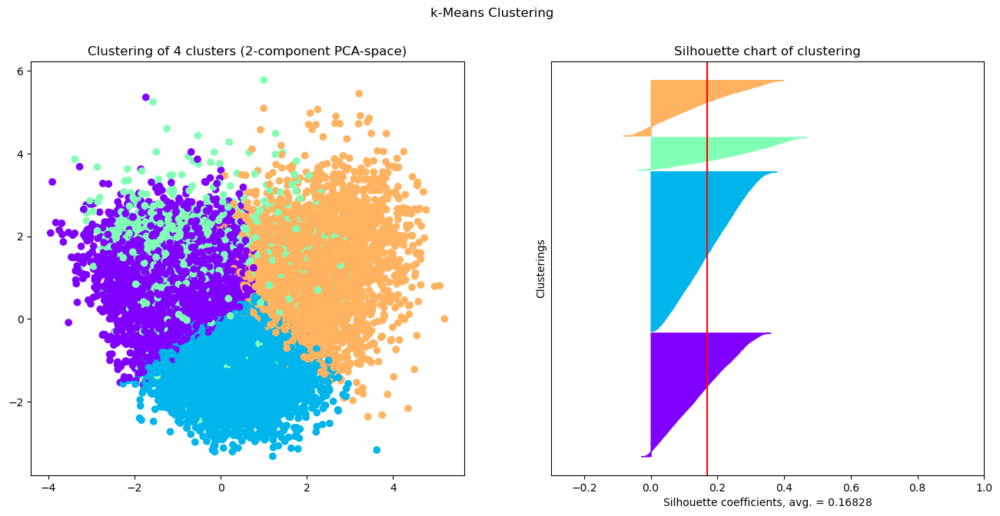

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

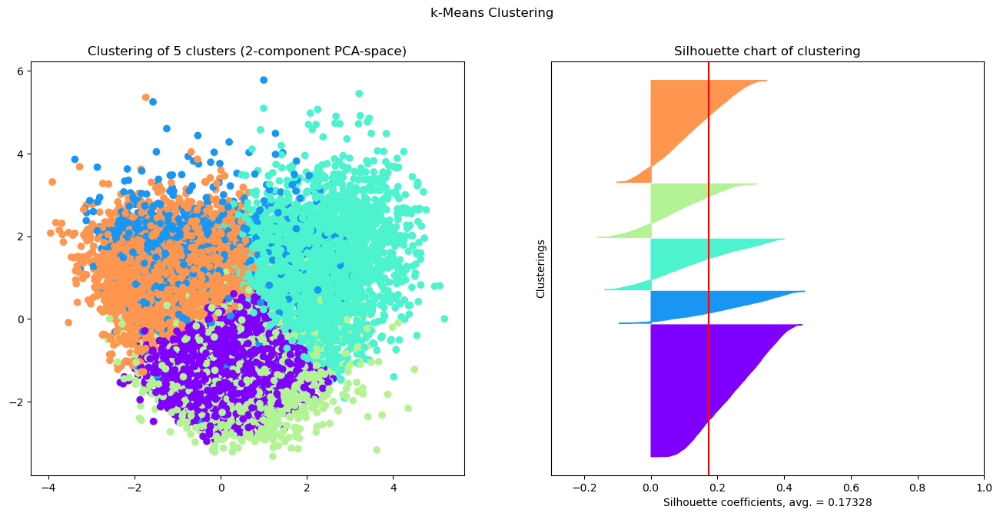

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

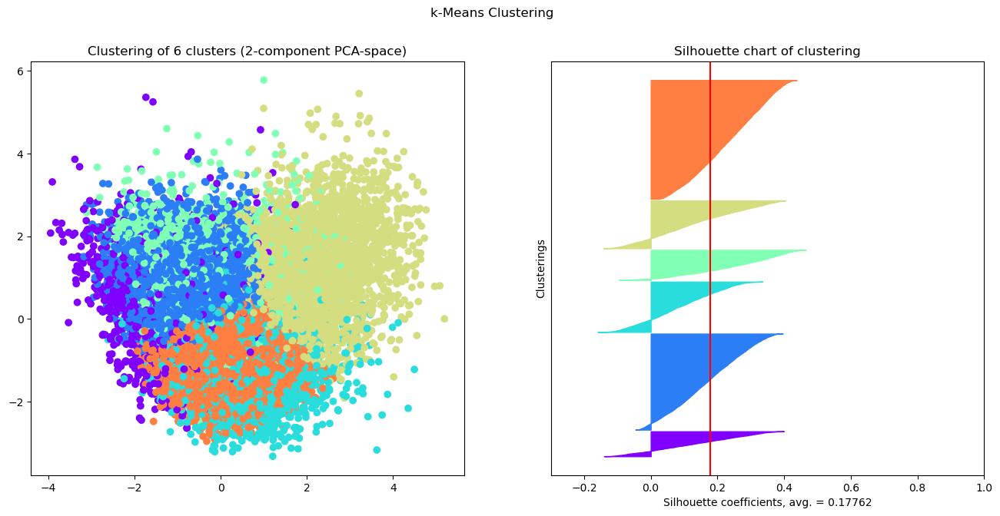

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

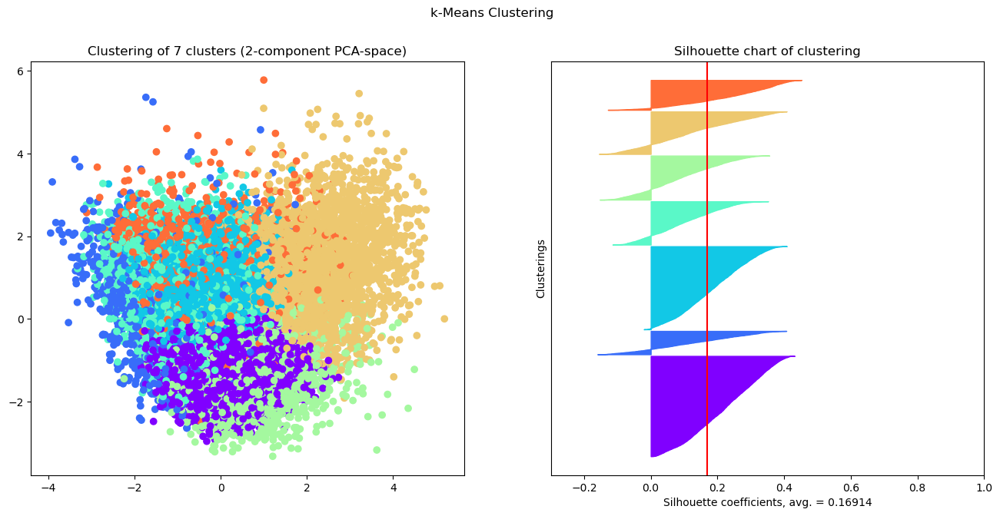

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

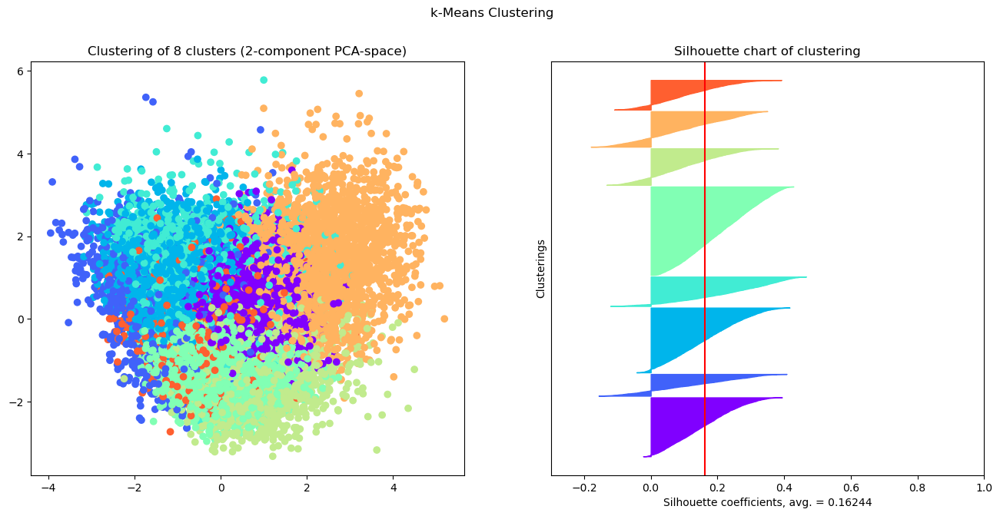

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

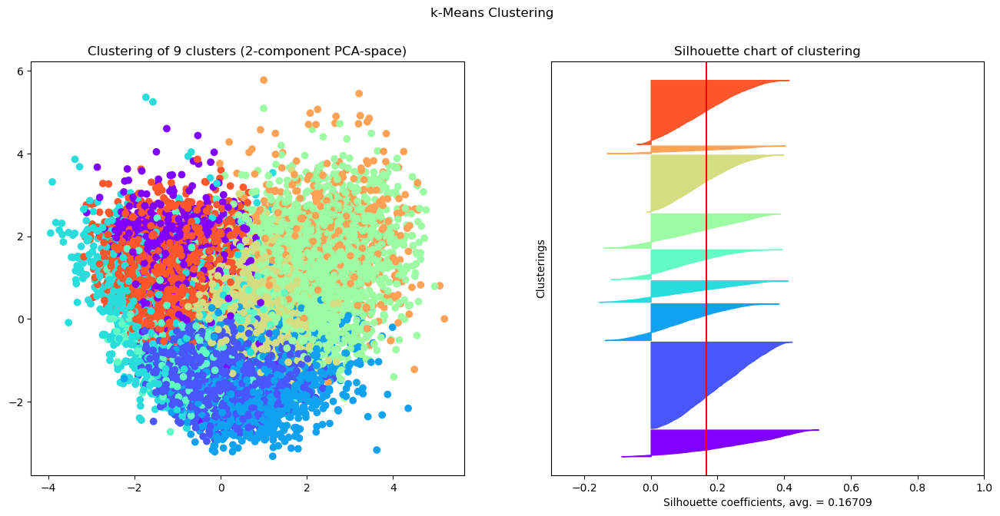

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

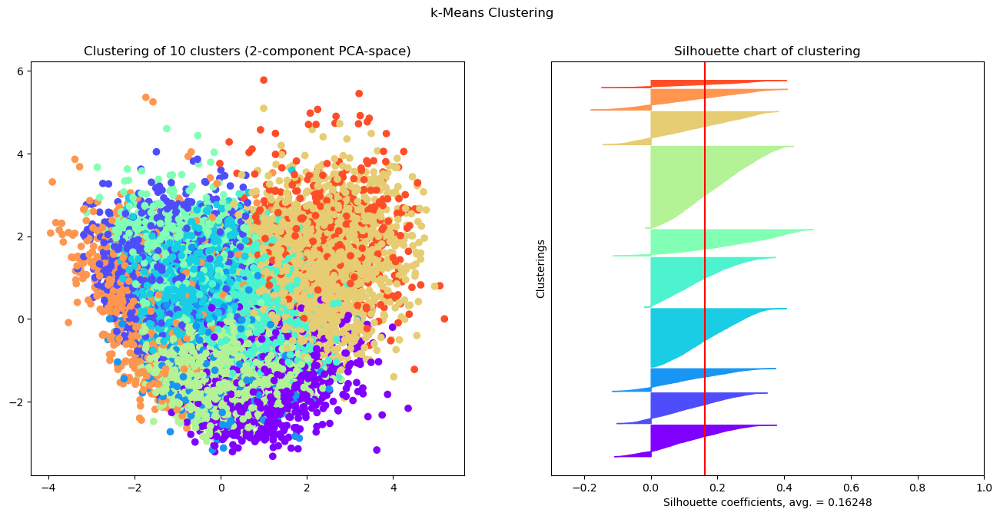

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

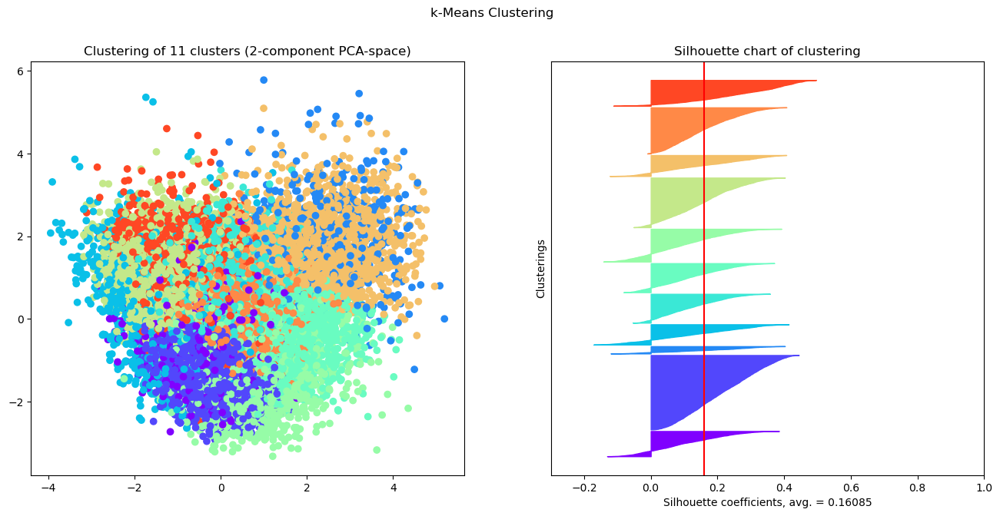

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

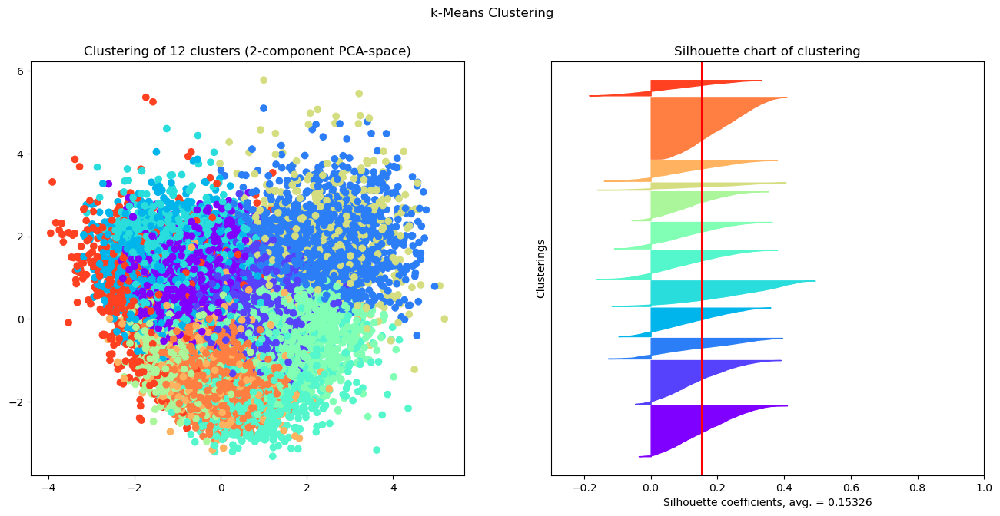

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

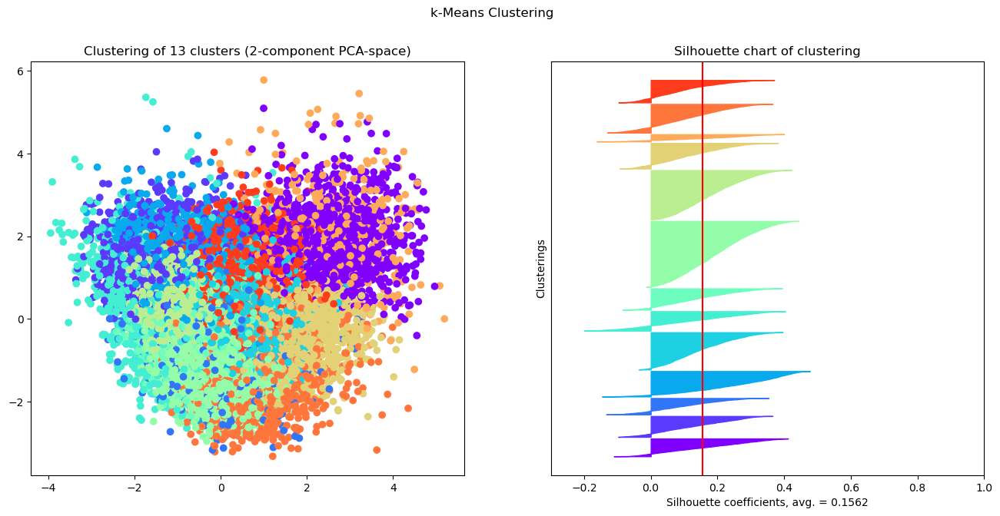

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

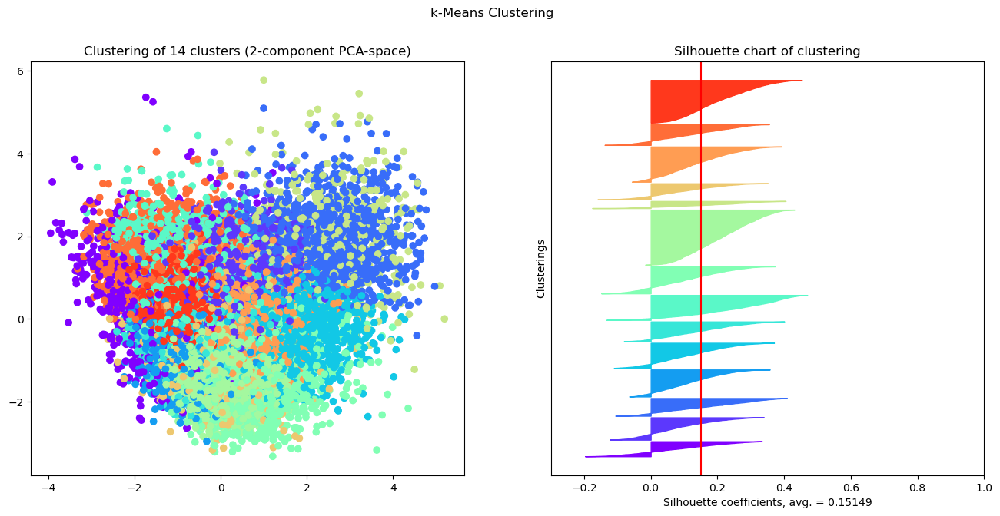

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

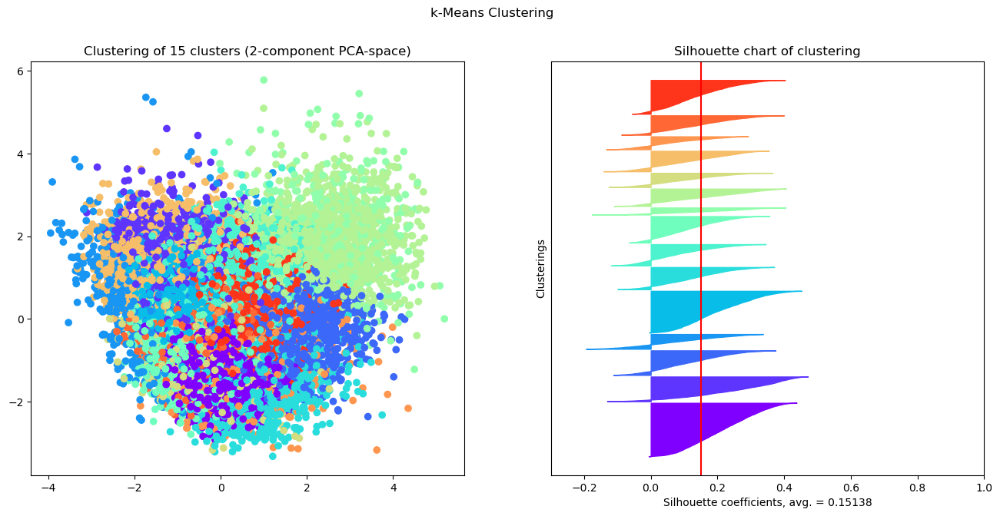

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

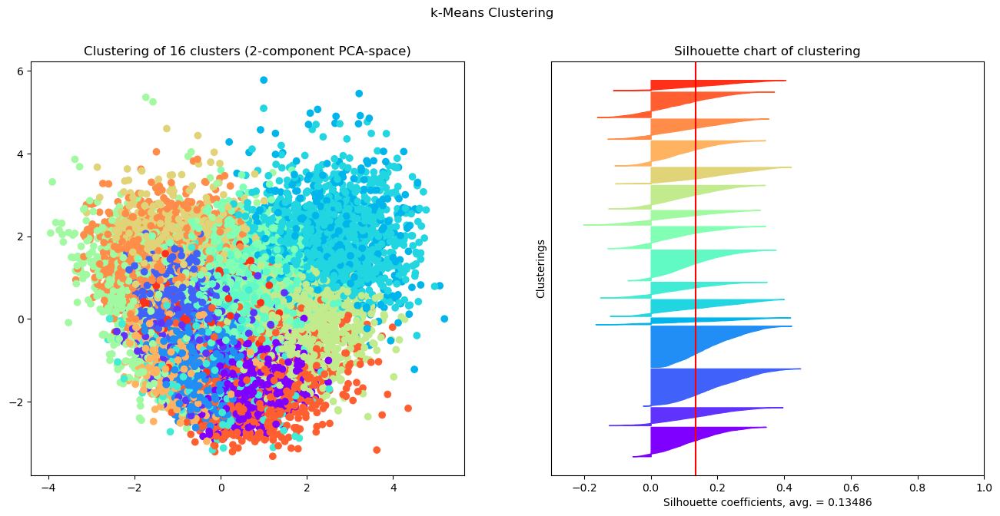

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

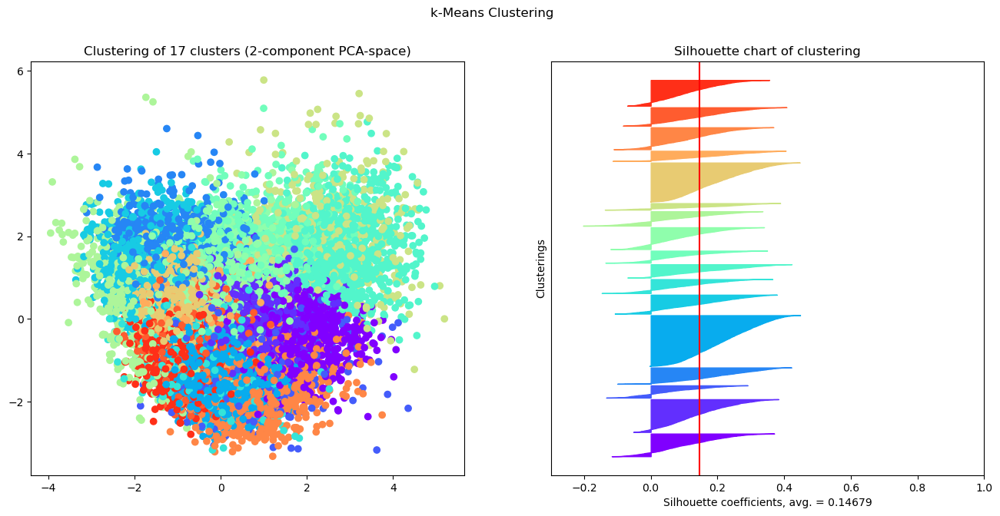

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

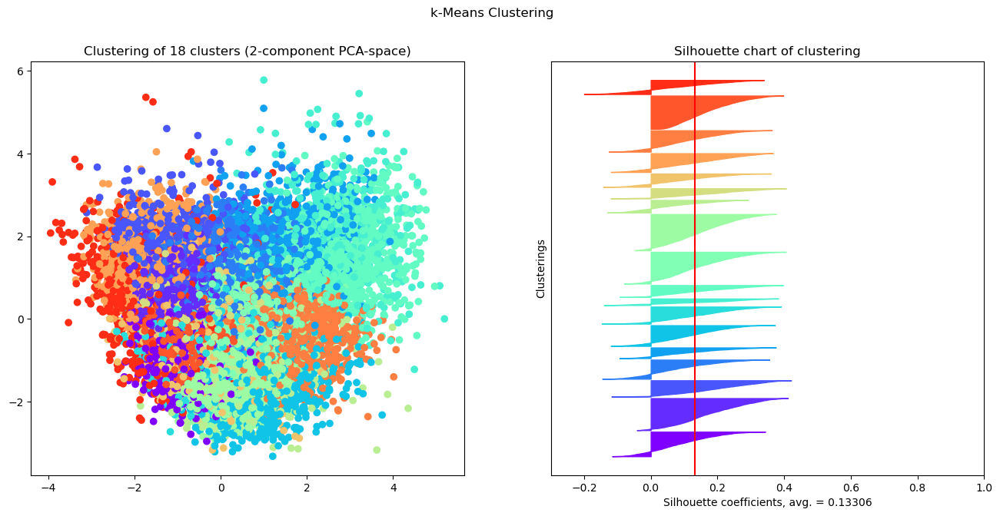

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

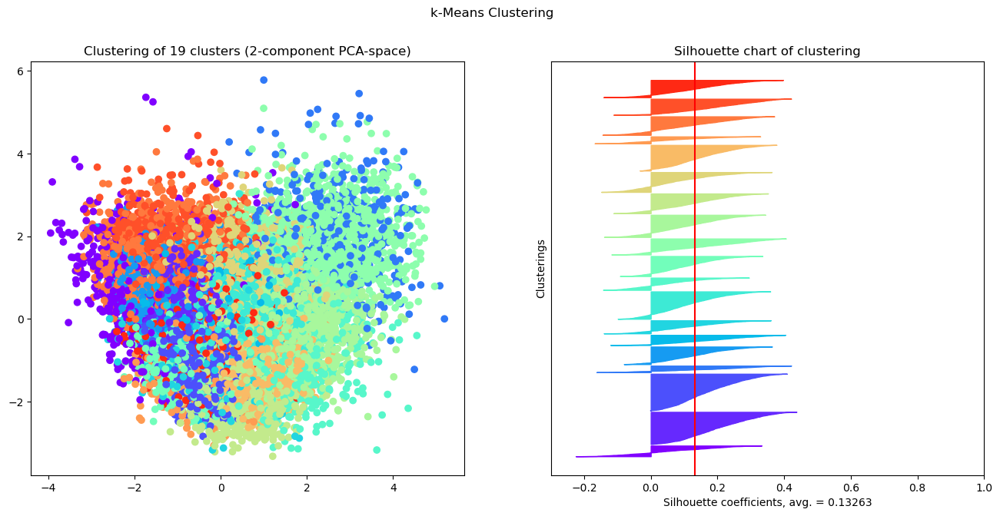

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

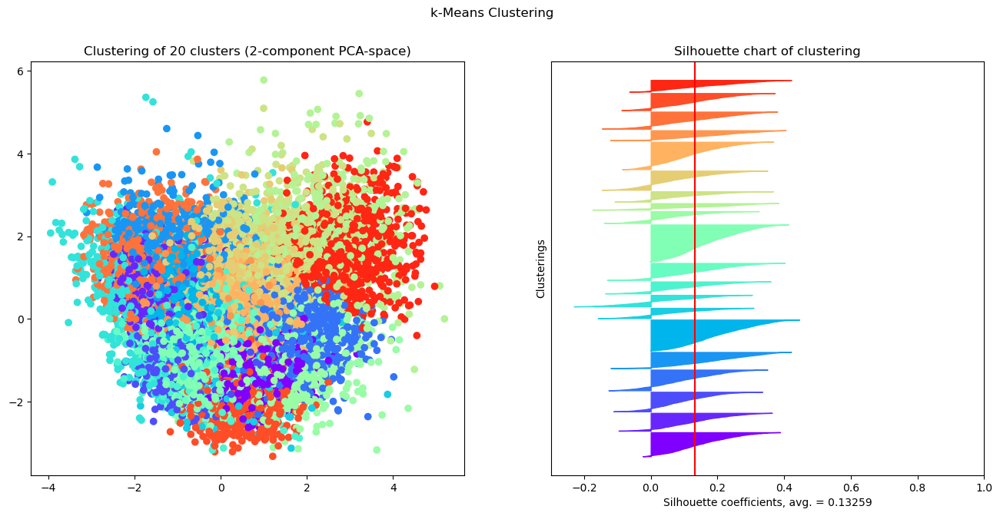

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

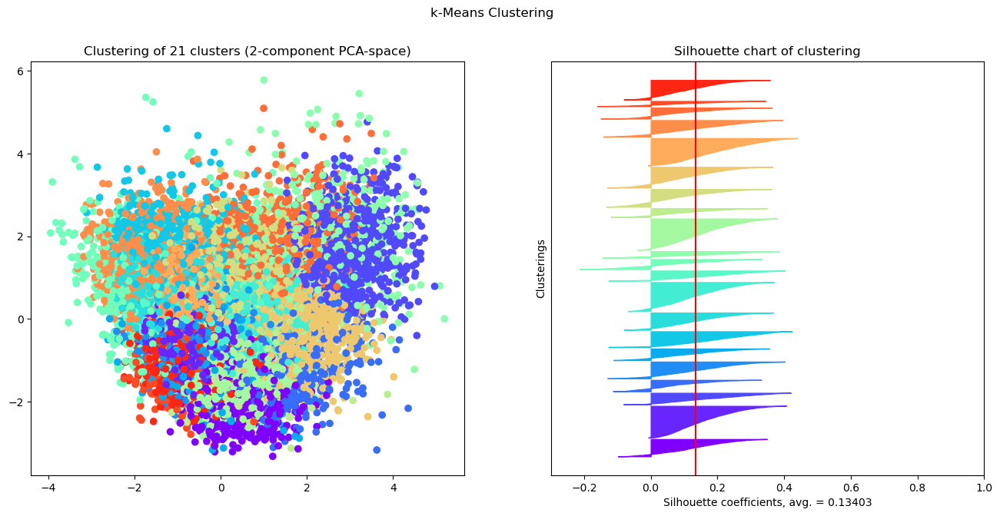

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

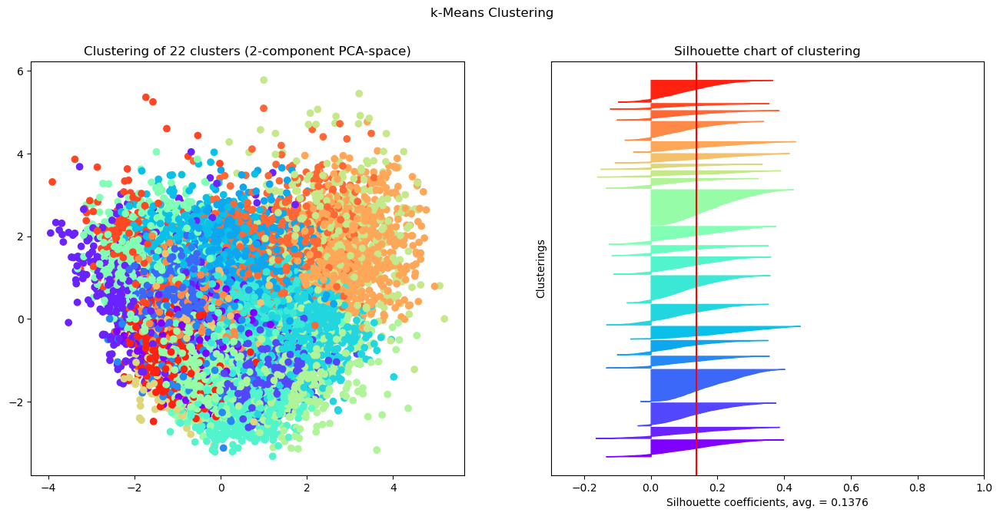

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

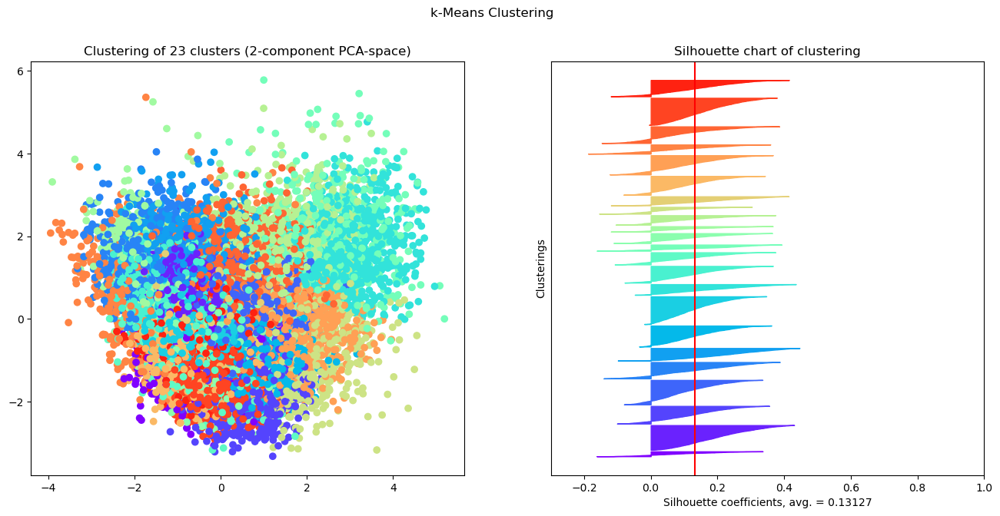

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

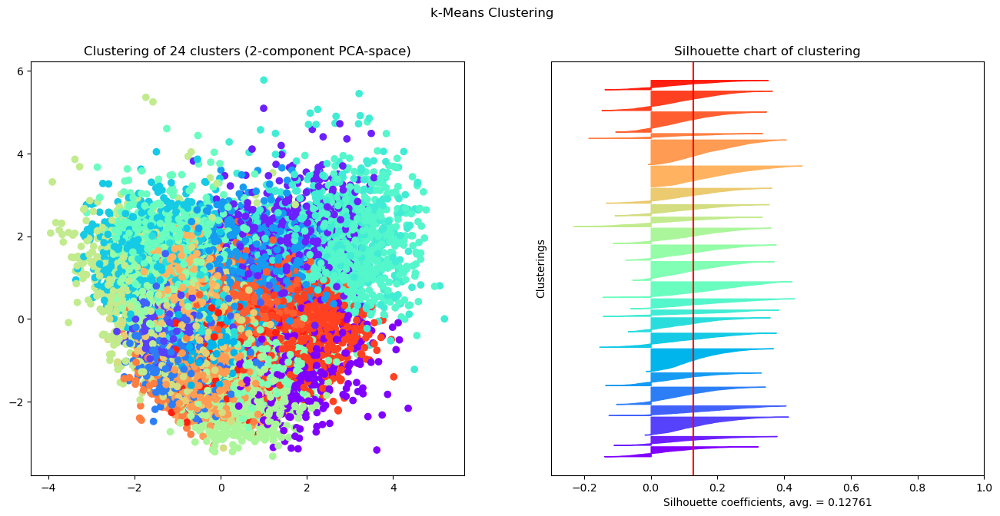

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

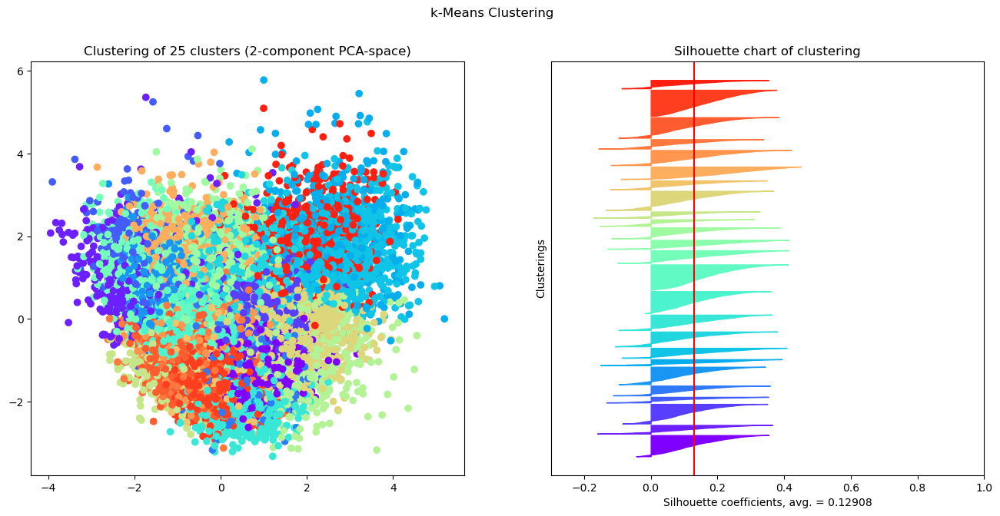

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

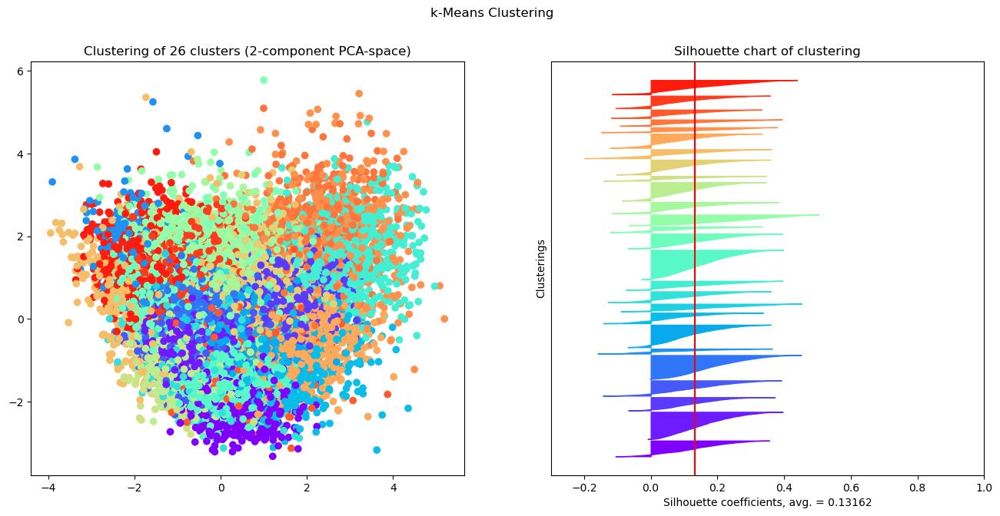

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

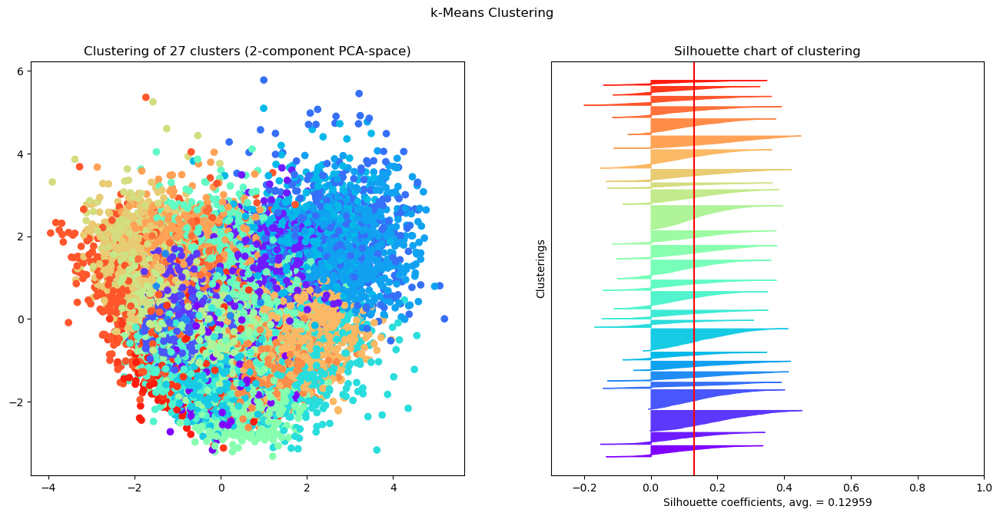

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

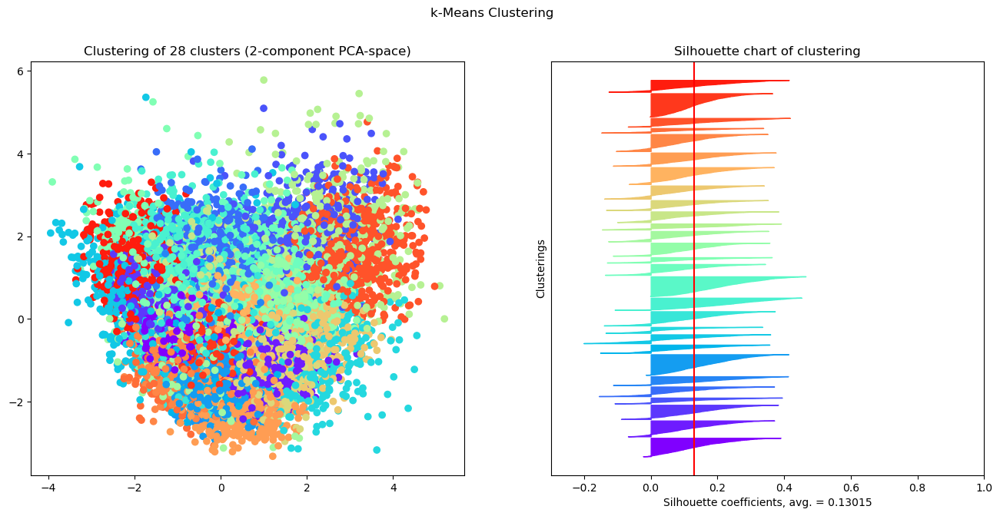

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

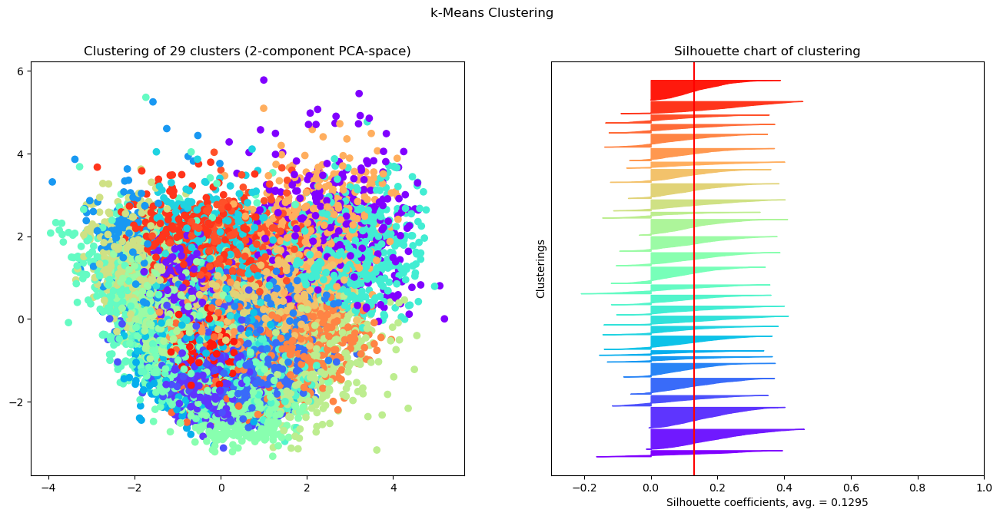

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

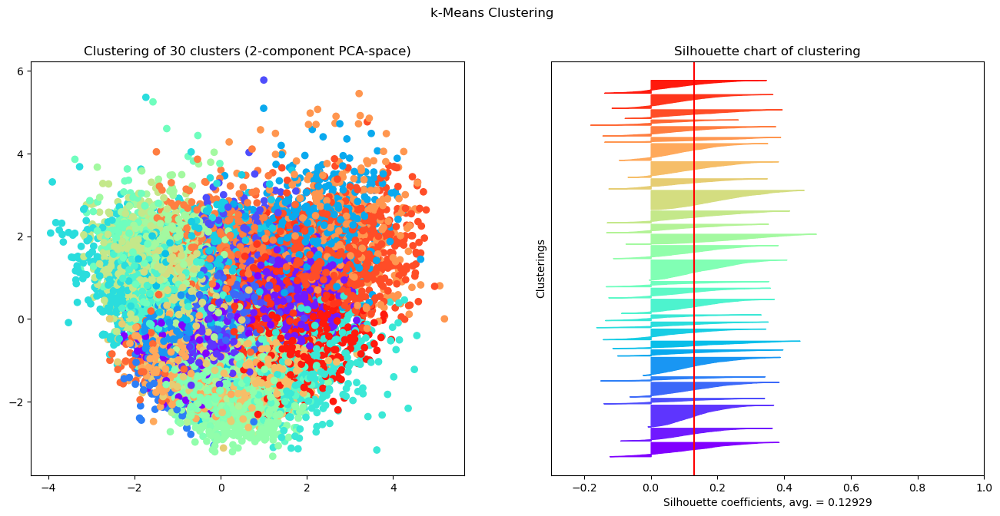

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

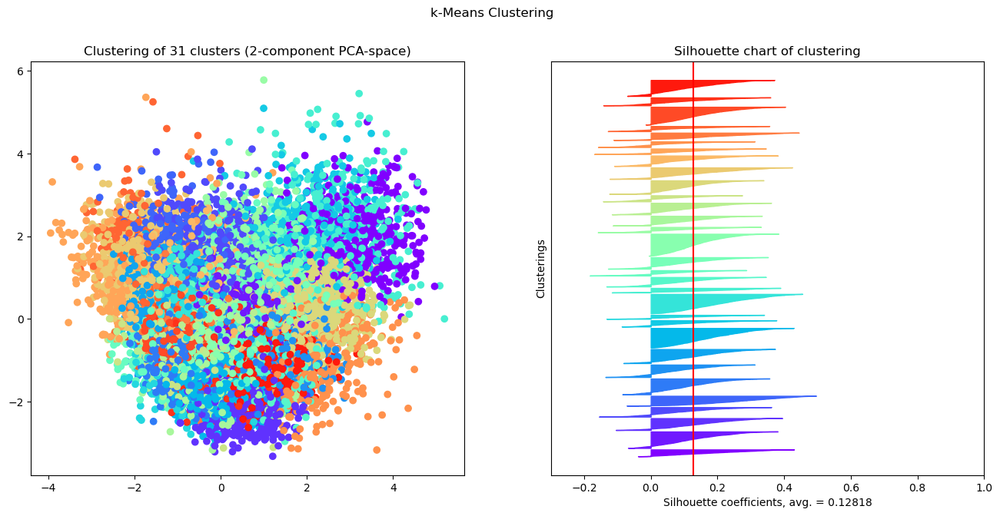

In [7]:
# ------             K-means Model              -------

max_clusters = 32

# Scale data, assuming normal distribution
transformer = StandardScaler()
scaled_audio_features = transformer.fit_transform(audio_features_df)

mean_squared_distances = []
for i in range(2, max_clusters):
    k_means_model = KMeans(init='k-means++', n_clusters=i, random_state=0).fit(scaled_audio_features)
    # Add meansquaredistance for elbow plot
    mean_squared_distances.append([i, k_means_model.inertia_])

mean_squared_distances = np.array(mean_squared_distances)
# Plot elbow-chart
plt.plot(mean_squared_distances[:,0], mean_squared_distances[:,1], marker='o', linestyle='dashed')
plt.title("Elbow Plot - K-means")
plt.xlabel("No. of Clusters")
plt.ylabel("Squared Mean Distance")
plt.show()

# Plot individual clusterings
for i in range(2, max_clusters):

    # Create Kmeans-model with i clusters
    k_means_model = KMeans(init='k-means++', n_clusters=i, random_state=0)
    k_means_model.fit(scaled_audio_features)
    
    # Get label for each track
    clustering_labels = k_means_model.labels_

    plot_cluster_silhouette(X = scaled_audio_features, labels=clustering_labels, nclusters=i, title="k-Means Clustering")

In [8]:
# ----------- CLUSTER ANALYSIS ---------------
    
no_clusters = 6

transformer = StandardScaler()
scaled_audio_features = transformer.fit_transform(audio_features_df)
k_means_model = KMeans(init='k-means++', n_clusters=no_clusters, random_state=0).fit(scaled_audio_features)
clustering_labels = k_means_model.labels_

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


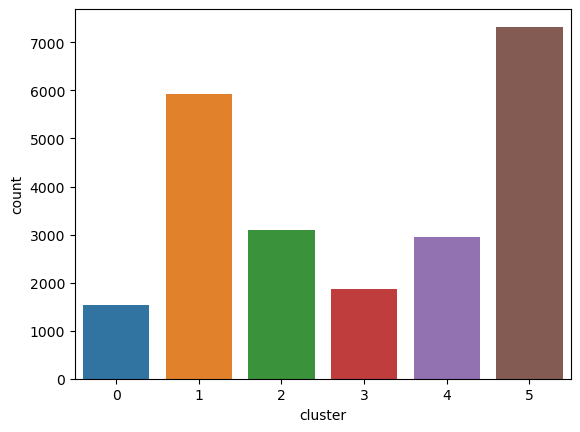

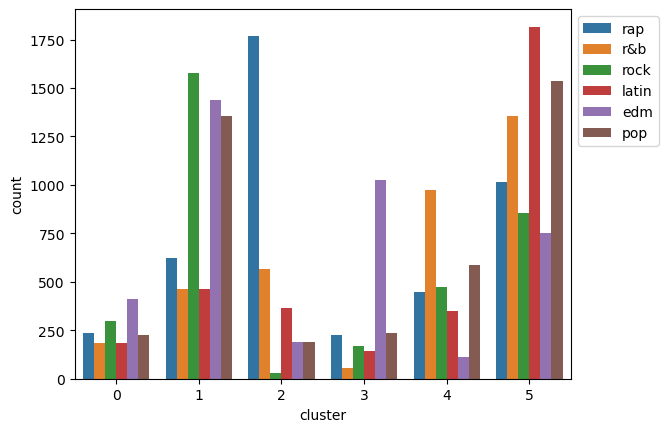

In [9]:
# ----------- CLUSTER ANALYSIS 2 ---------------
data_df['cluster'] = clustering_labels

# Count nr of items in each cluster
sns.countplot(data_df, x=data_df['cluster'])
plt.show()
plt.clf()

# Show genre distribution in cluster
ax = sns.countplot(data_df, x='cluster', hue='playlist_genre')
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

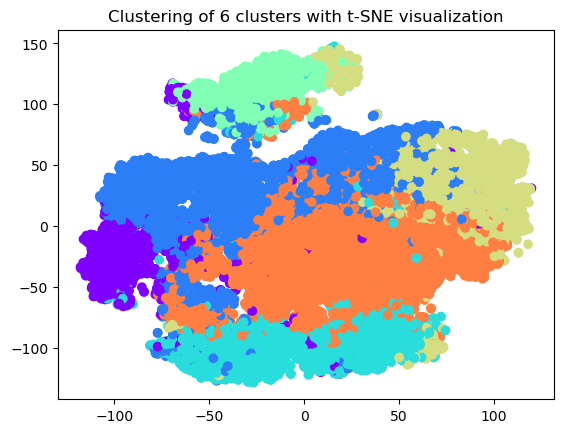

In [10]:
# ----------- CLUSTER ANALYSIS 3 ---------------
# SLOW!
# Plot best configuration using t-SNE 

# Transform data using t-SNE
tsne_transformed_data = TSNE(n_components=2, perplexity=50, n_iter=3000).fit_transform(scaled_audio_features)

# Plot clustering
colormap = plt.cm.rainbow(clustering_labels.astype(float)/no_clusters)
plt.clf()
plt.title(f"Clustering of {no_clusters} clusters with t-SNE visualization")
plt.scatter(tsne_transformed_data[:,0], tsne_transformed_data[:,1], c=colormap)
plt.show()

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of

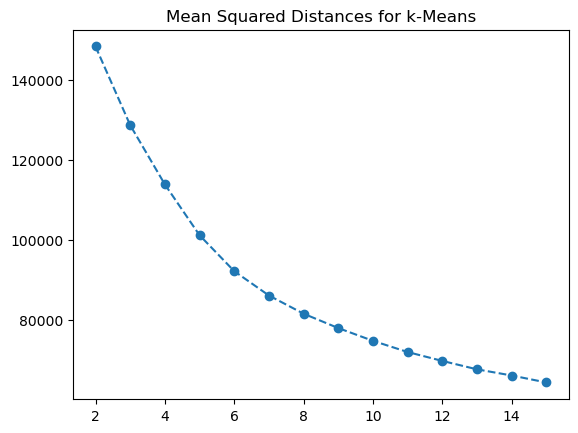

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

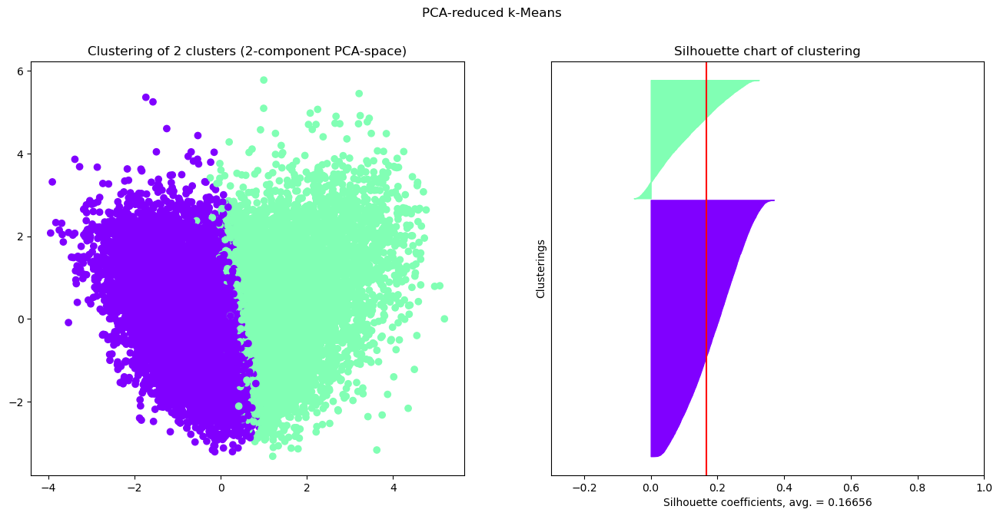

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

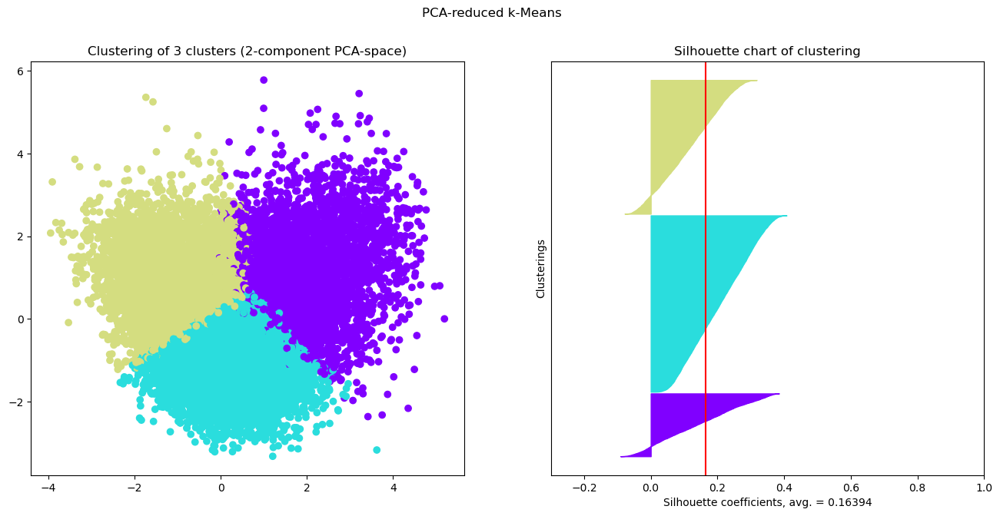

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

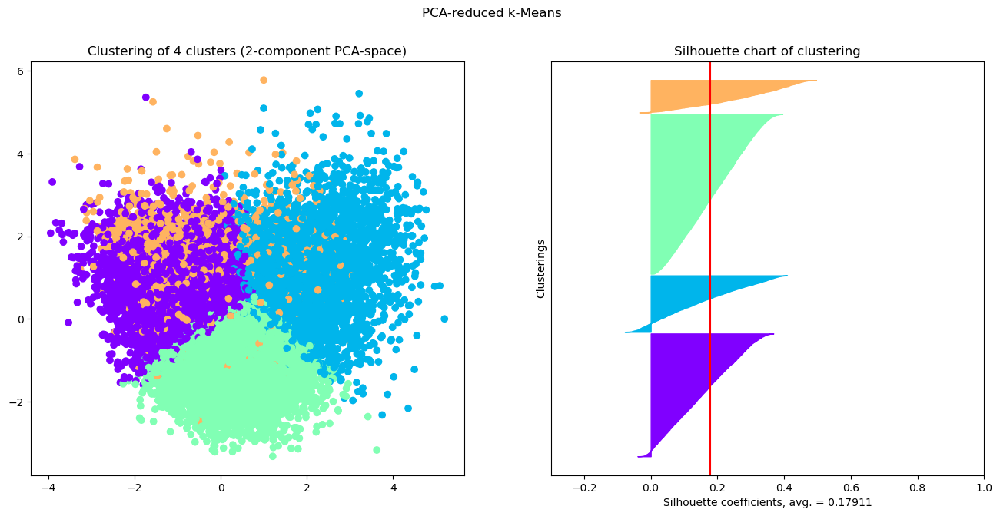

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

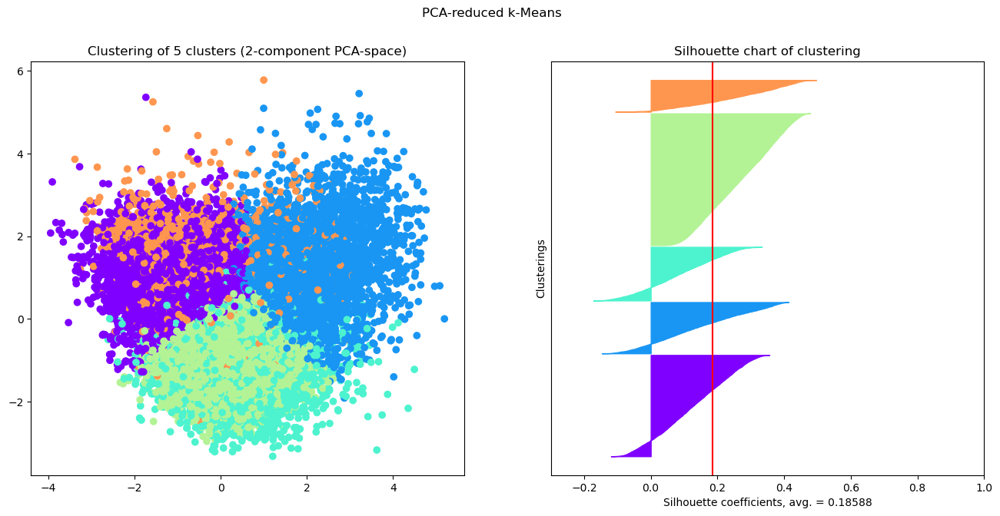

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

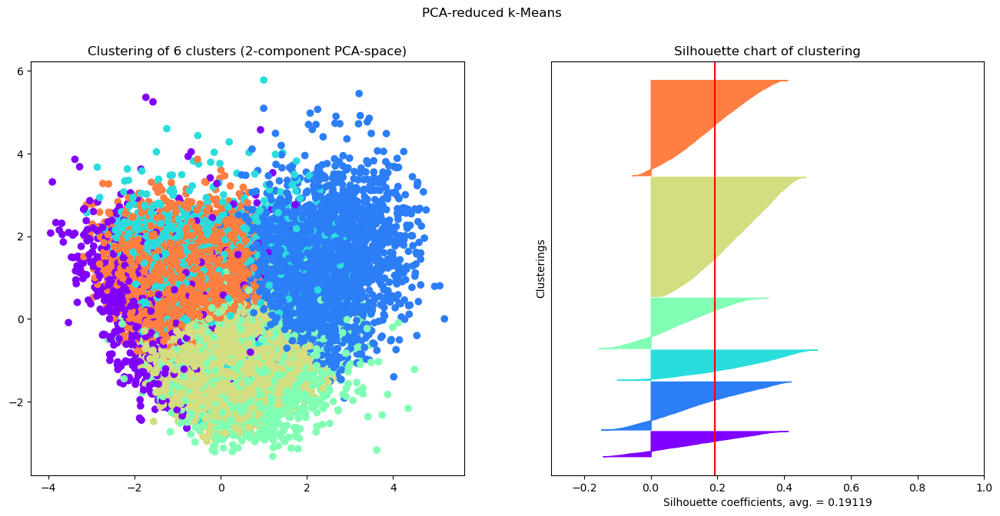

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

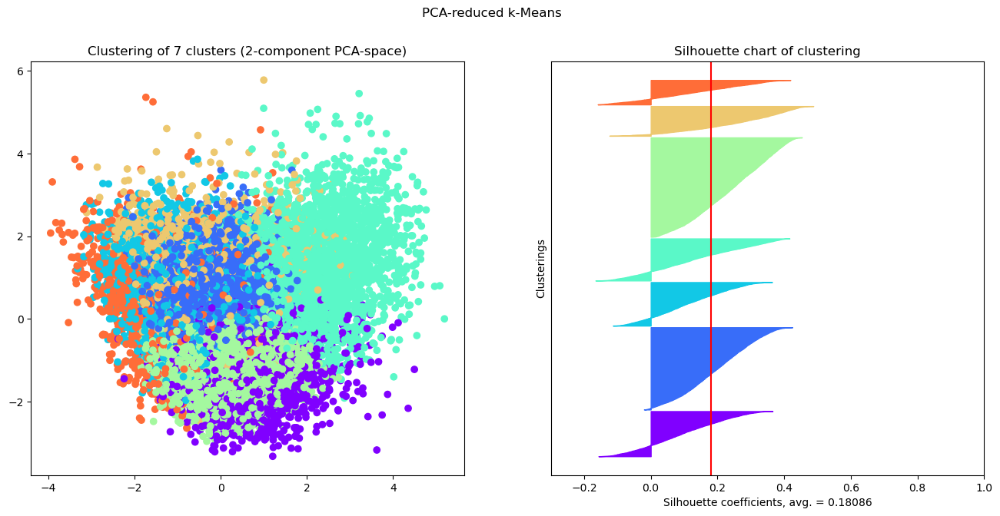

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

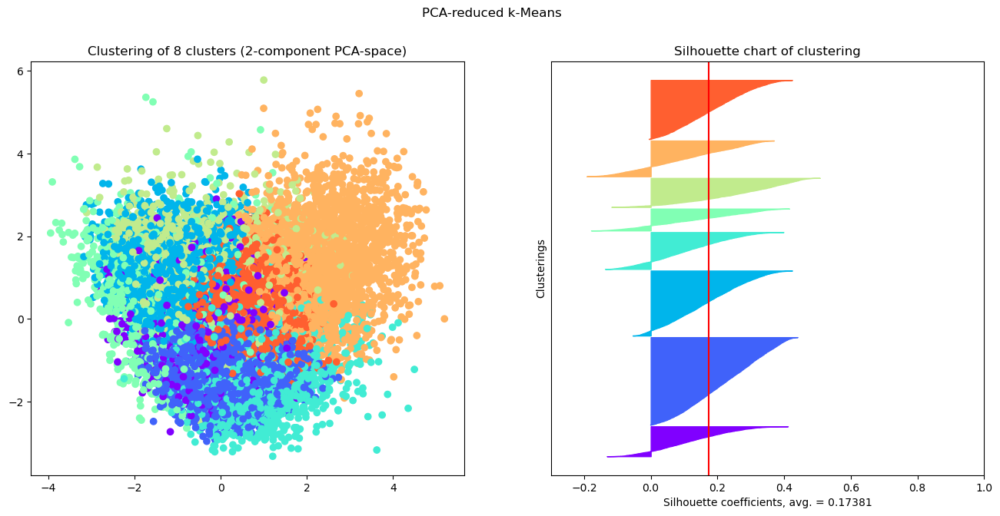

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

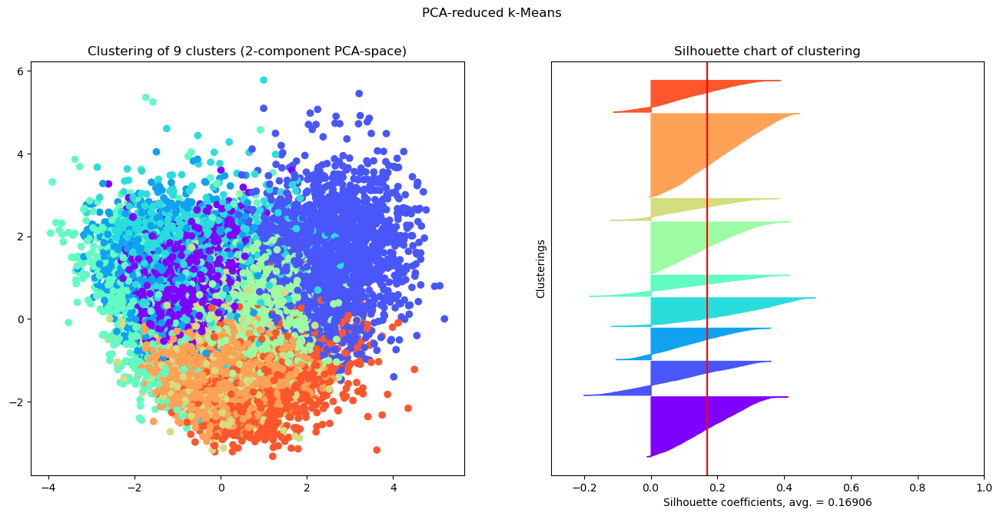

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

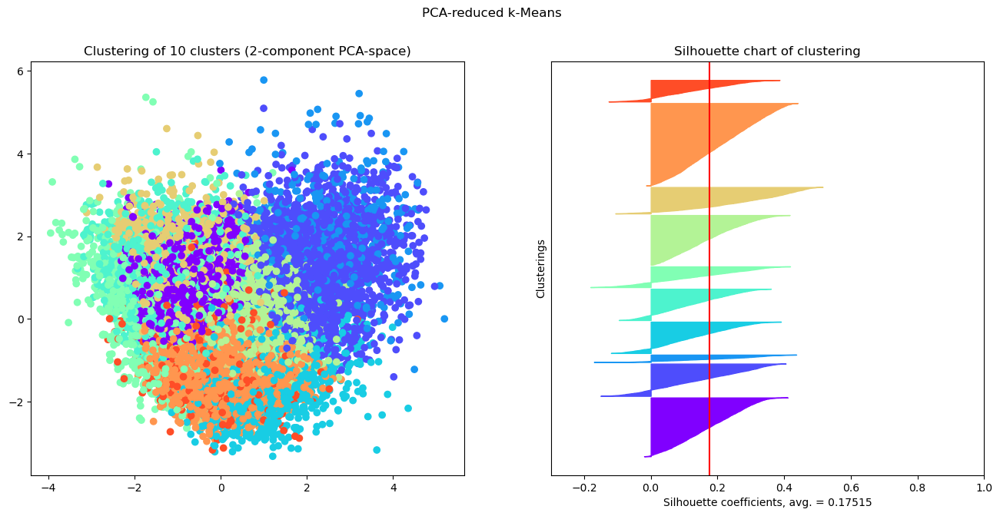

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

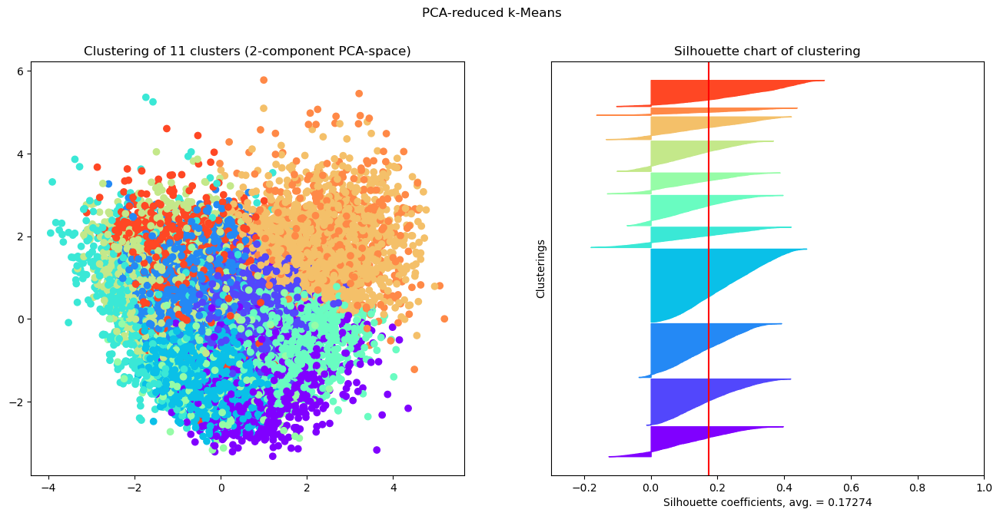

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

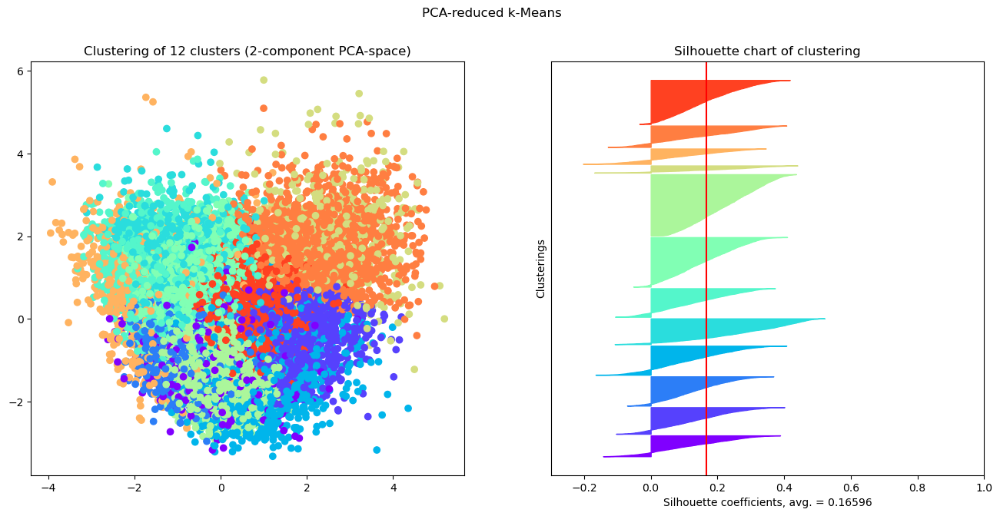

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

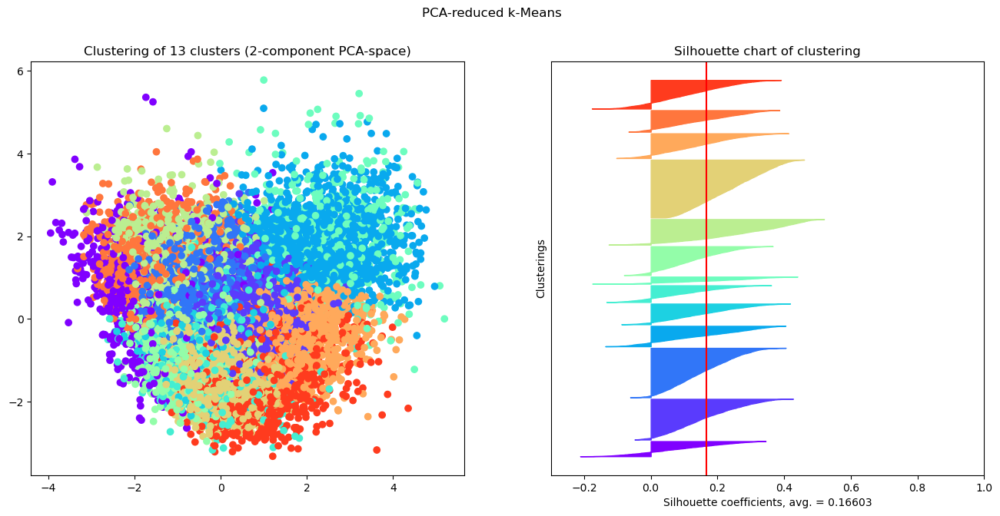

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

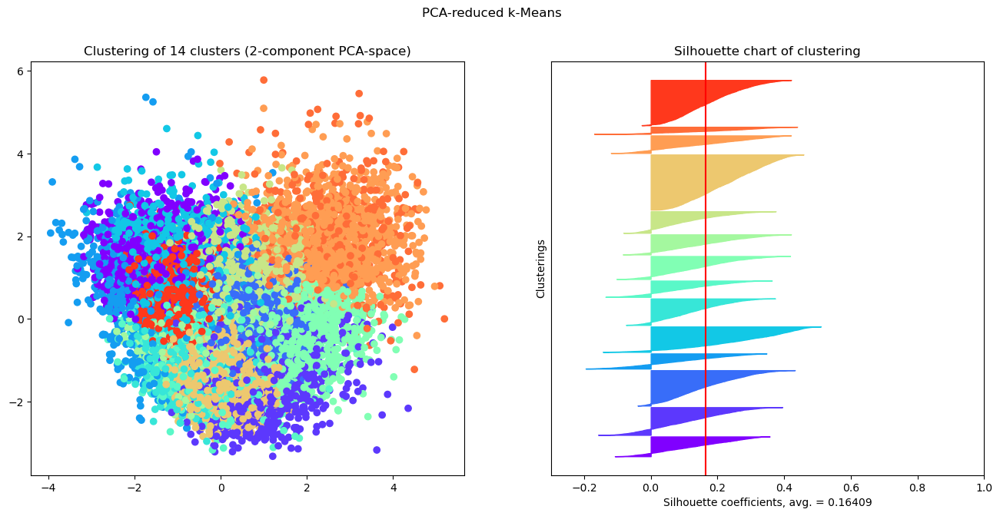

/Users/maltejohnsen/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<Figure size 640x480 with 0 Axes>

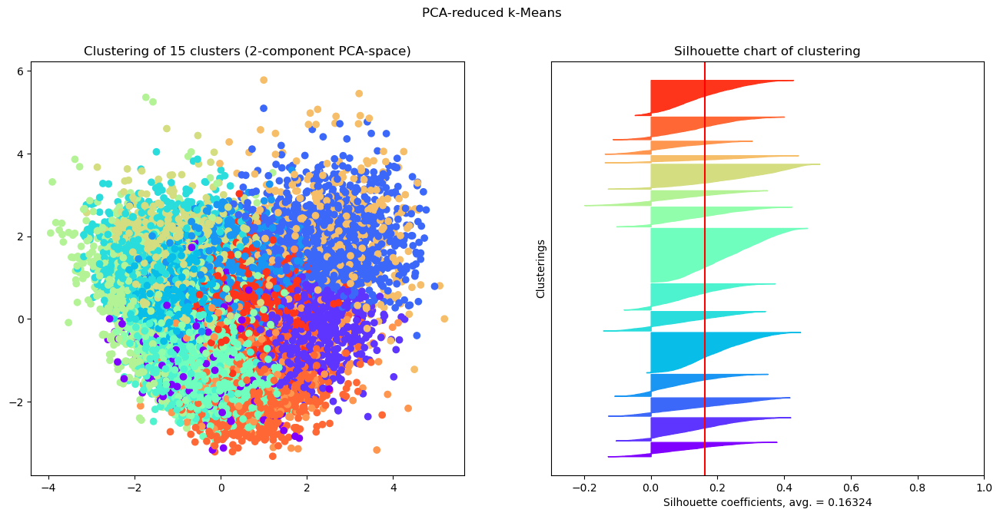

In [11]:
# ------             K-means Model (REDUCED DIMENSIONALITY)              -------

max_clusters = 16

# Scale data, assuming normal distribution
transformer = StandardScaler()
scaled_audio_features = transformer.fit_transform(audio_features_df)

# Transform to 2 dimensions with PCA
pca_model = PCA(n_components=7, copy=True)
scaled_audio_features = pca_model.fit_transform(X=scaled_audio_features)

# Add meansquaredistance for elbow plot
mean_squared_distances = []
for i in range(2, max_clusters):
    k_means_model = KMeans(init='k-means++', n_clusters=i).fit(scaled_audio_features)
    mean_squared_distances.append([i, k_means_model.inertia_])

mean_squared_distances = np.array(mean_squared_distances)
# Plot elbow-chart
plt.plot(mean_squared_distances[:,0], mean_squared_distances[:,1], marker='o', linestyle='dashed')
plt.title("Mean Squared Distances for k-Means")
plt.show()

# Plot individual clusterings
for i in range(2, max_clusters):

    # Create Kmeans-model with i clusters
    k_means_model = KMeans(init='k-means++', n_clusters=i)
    k_means_model.fit(scaled_audio_features)
    
    # Get label for each track
    clustering_labels = k_means_model.labels_

    plot_cluster_silhouette(X = scaled_audio_features, labels=clustering_labels, nclusters=i, title="PCA-reduced k-Means")

<Figure size 640x480 with 0 Axes>

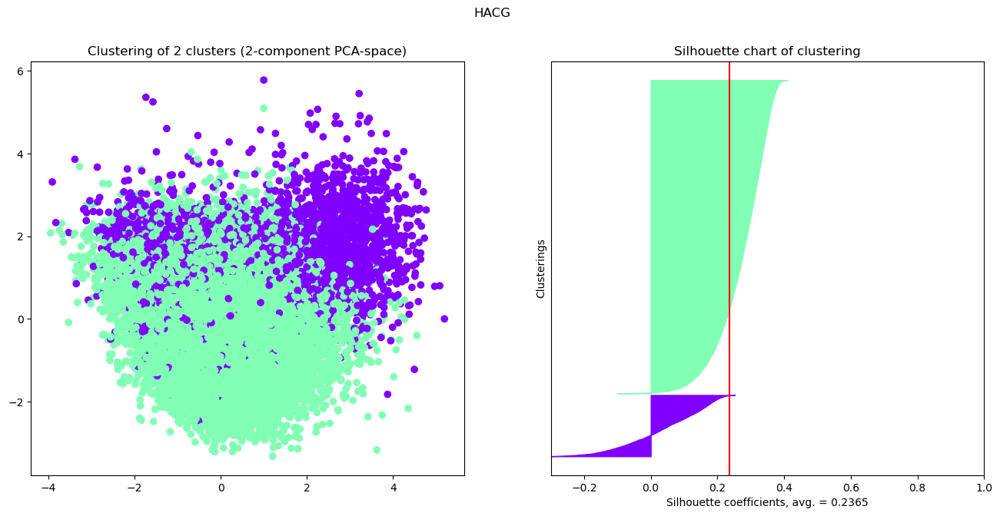

<Figure size 640x480 with 0 Axes>

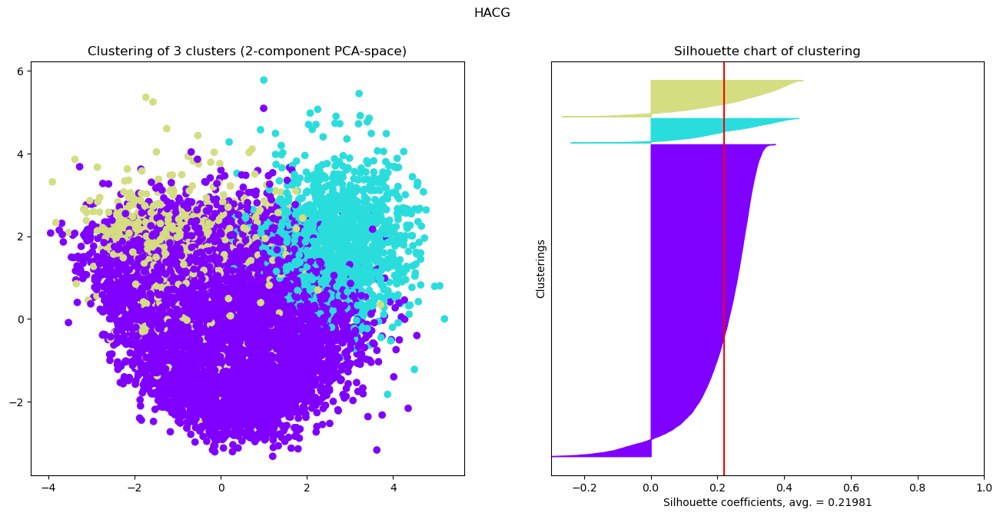

<Figure size 640x480 with 0 Axes>

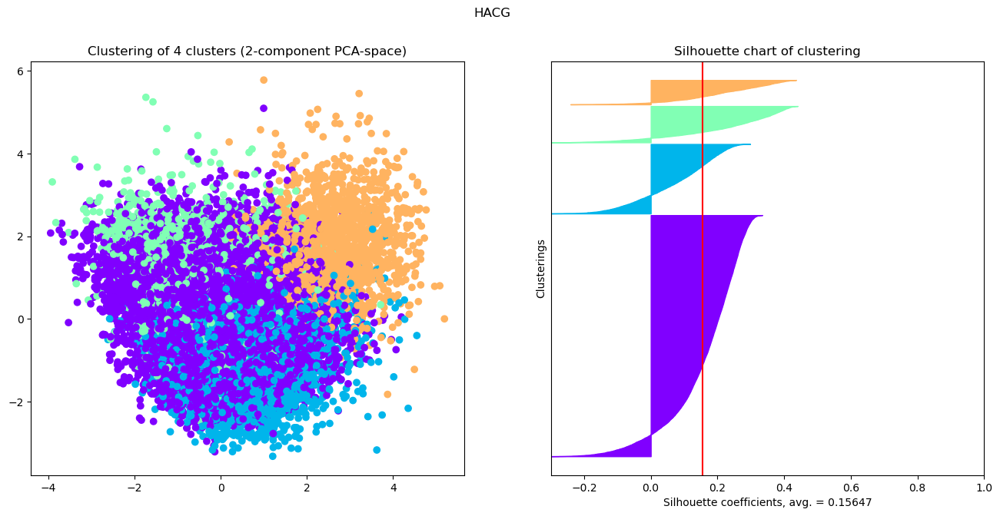

<Figure size 640x480 with 0 Axes>

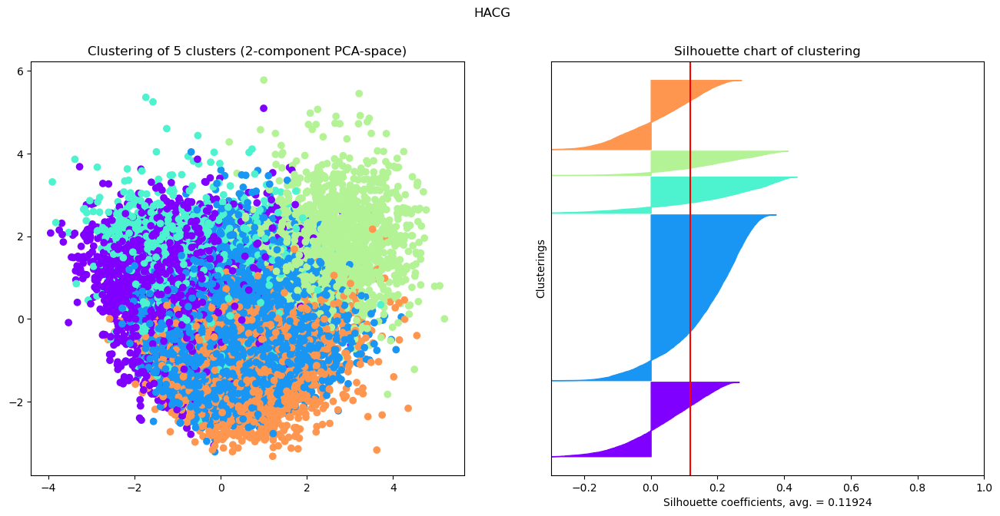

<Figure size 640x480 with 0 Axes>

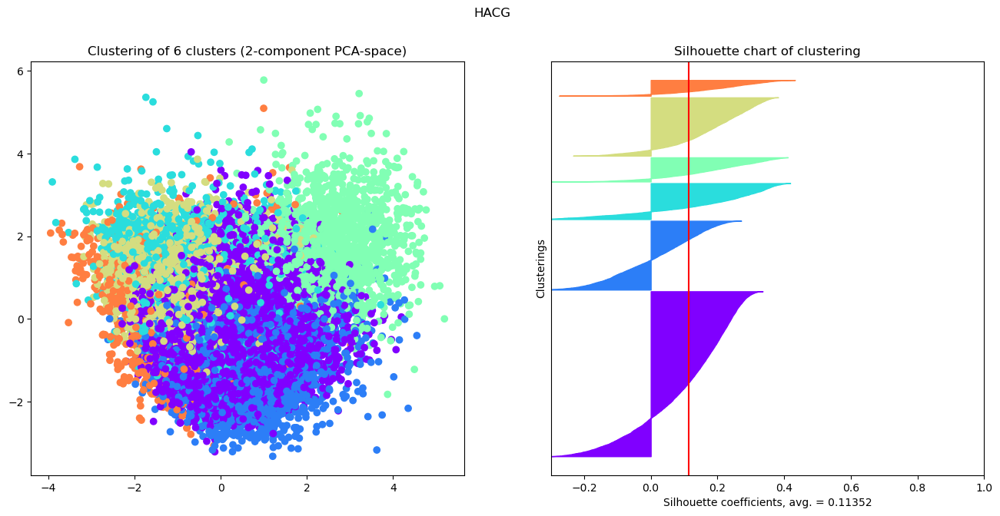

<Figure size 640x480 with 0 Axes>

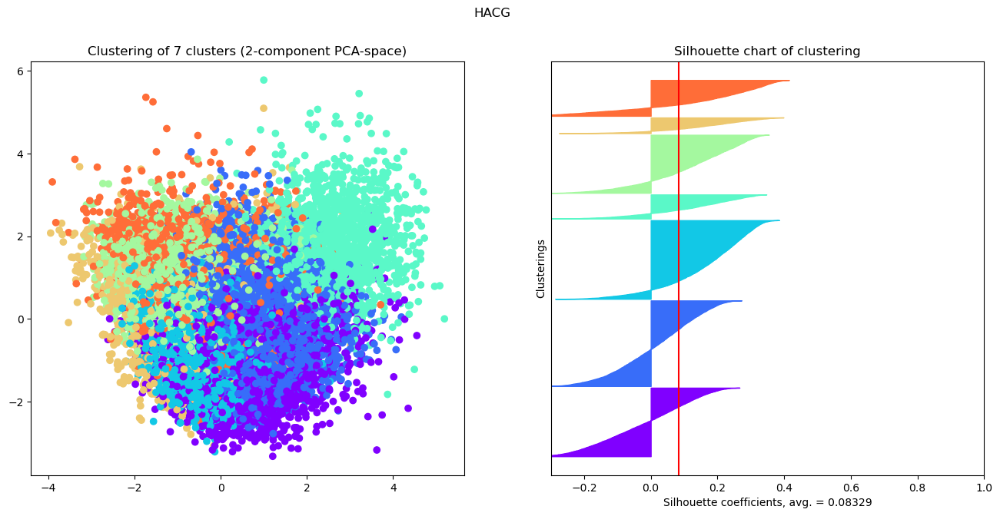

<Figure size 640x480 with 0 Axes>

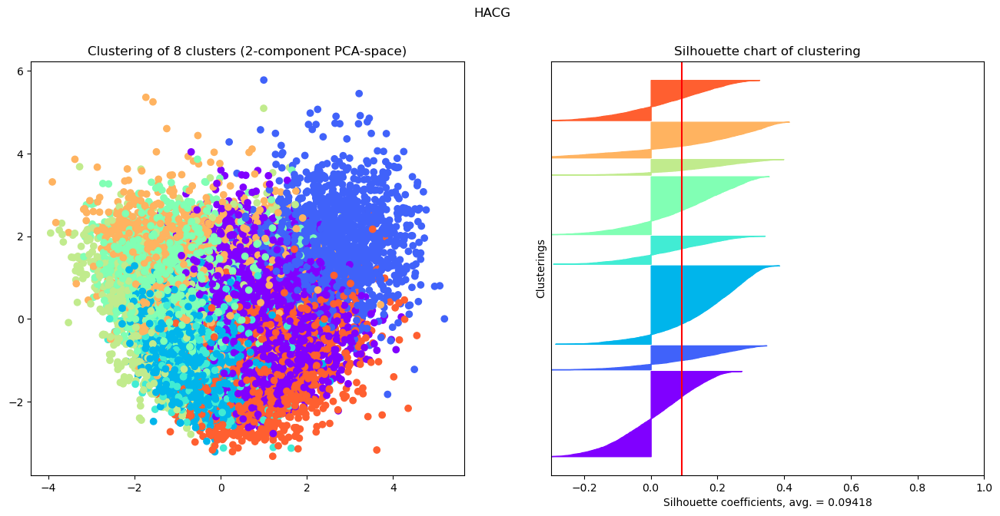

<Figure size 640x480 with 0 Axes>

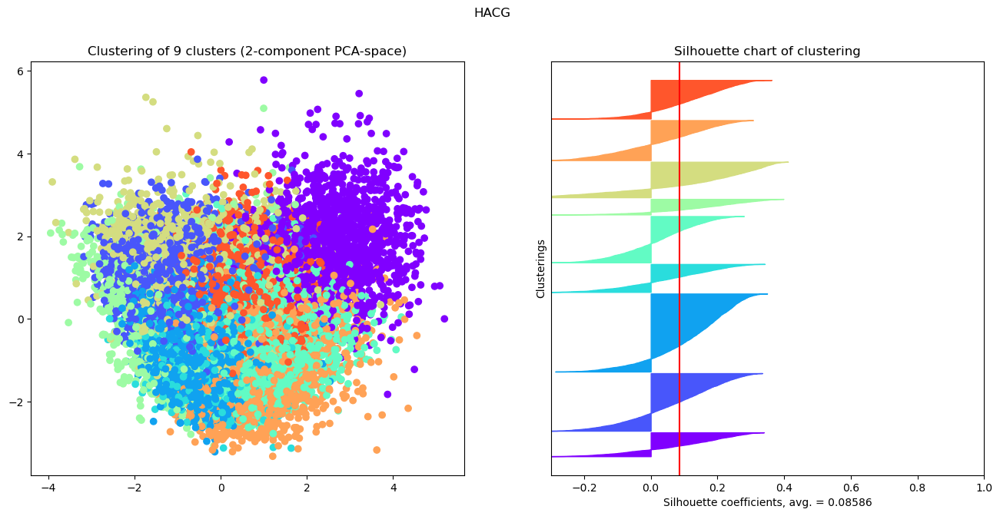

In [12]:
# ------             HACG              -------

max_clusters = 10

# Scale data, assuming normal distribution
transformer = StandardScaler()
scaled_audio_features = transformer.fit_transform(audio_features_df)

for i in range(2, max_clusters):

    # Create HAC-model with i clusters
    k_means_model = AgglomerativeClustering(n_clusters=i, linkage='ward')
    k_means_model.fit(scaled_audio_features)
    
    # Get label for each track
    clustering_labels = k_means_model.labels_

    plot_cluster_silhouette(X = scaled_audio_features, labels=clustering_labels, nclusters=i, title="HACG")

<Figure size 640x480 with 0 Axes>

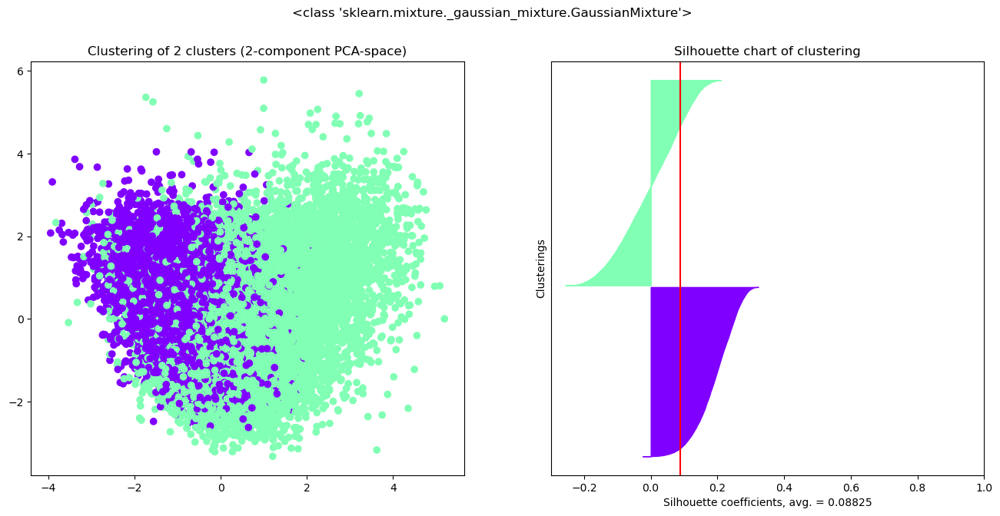

<Figure size 640x480 with 0 Axes>

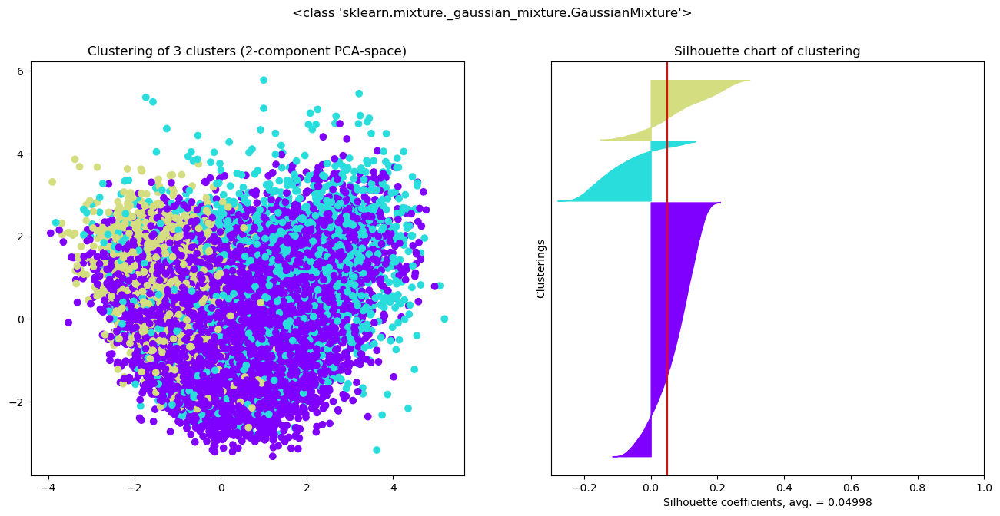

<Figure size 640x480 with 0 Axes>

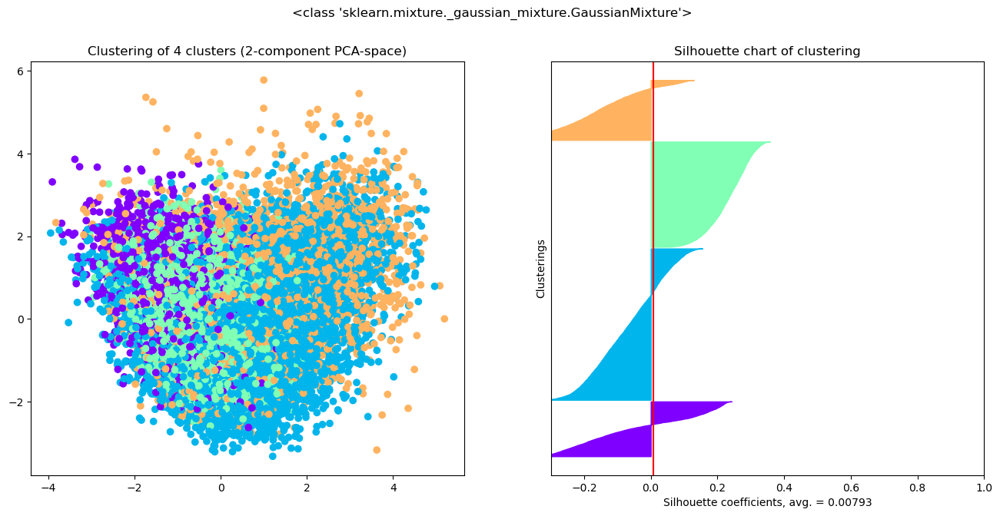

<Figure size 640x480 with 0 Axes>

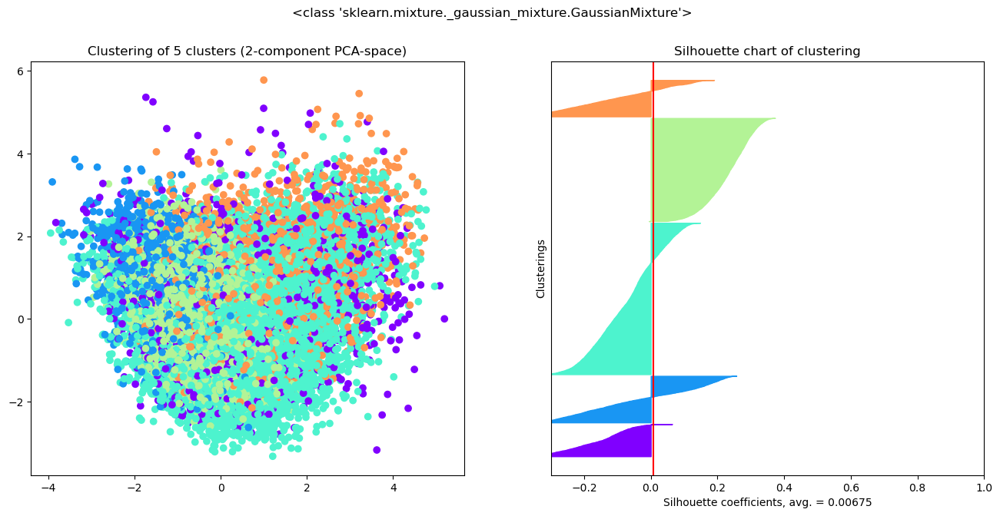

<Figure size 640x480 with 0 Axes>

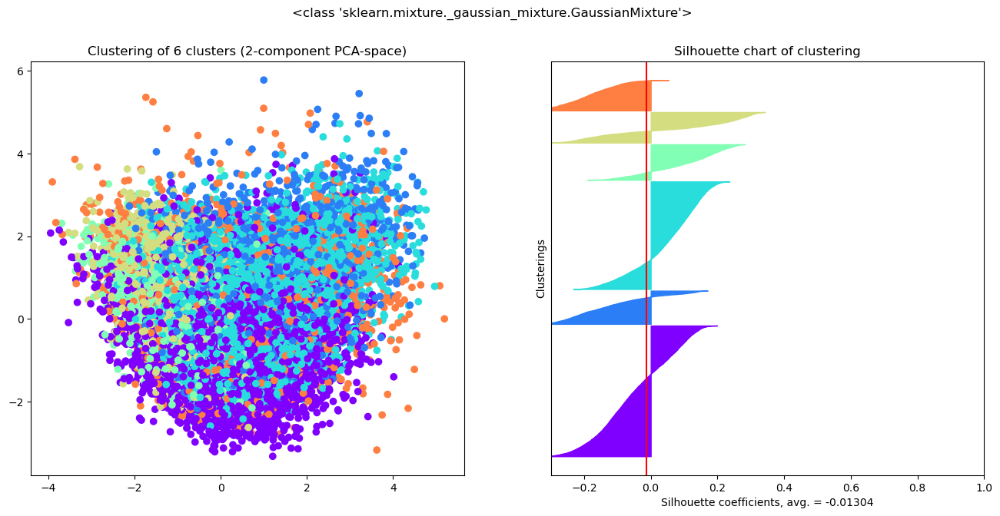

<Figure size 640x480 with 0 Axes>

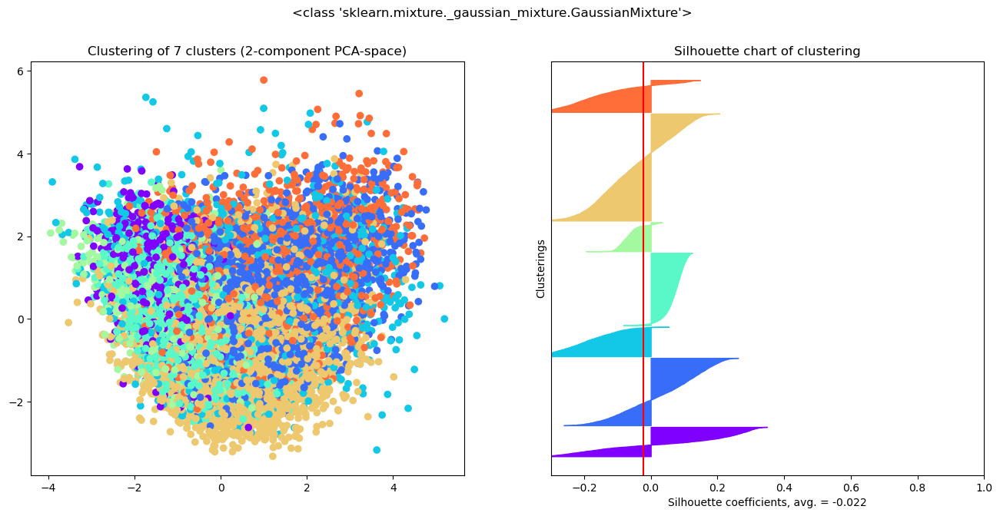

<Figure size 640x480 with 0 Axes>

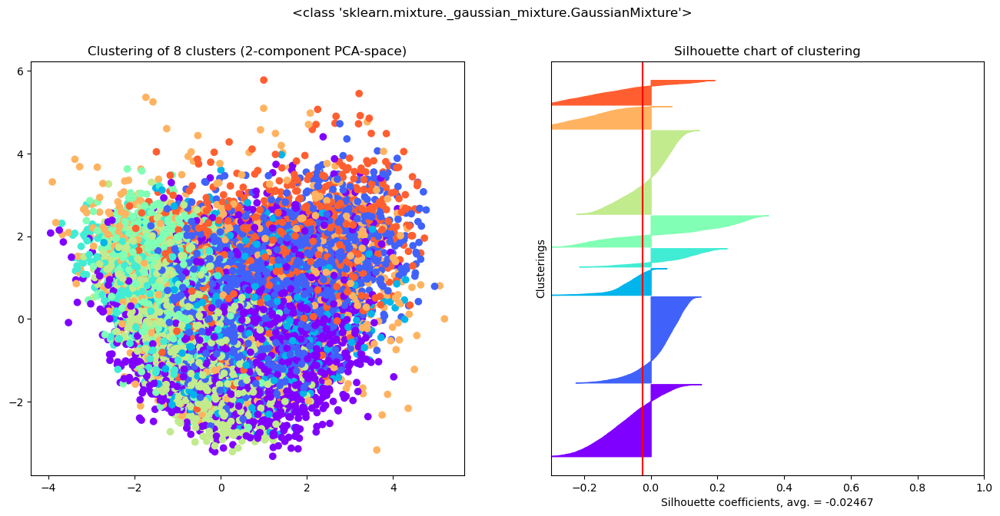

<Figure size 640x480 with 0 Axes>

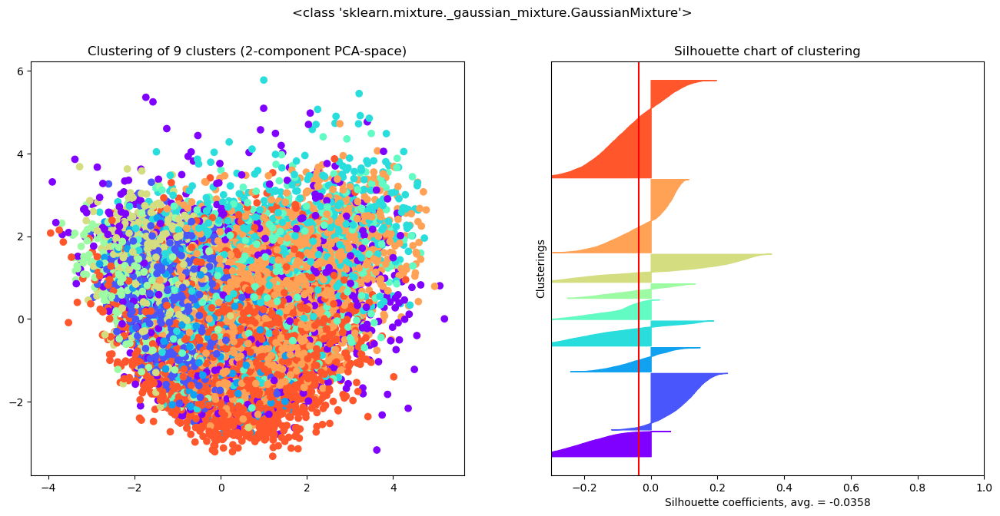

In [13]:
# ------            GAUSSIAN MM              -------
    
# Scale data, assuming normal distribution
transformer = StandardScaler()
scaled_audio_features = transformer.fit_transform(audio_features_df)

for i in range(2, 10):

    # Create GMM with i clusters
    guassian_model = GaussianMixture(n_components=i)
    clustering_labels = guassian_model.fit_predict(scaled_audio_features)

    plot_cluster_silhouette(X = scaled_audio_features, labels=clustering_labels, nclusters=i, title=GaussianMixture)

<Figure size 640x480 with 0 Axes>

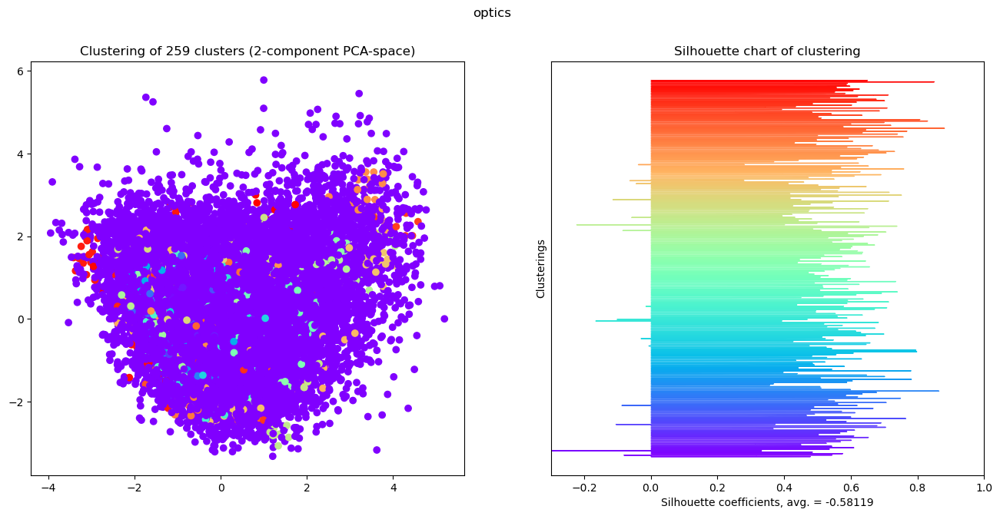

In [14]:
# ------            OPTICS              -------

# Scale data, assuming normal distribution
transformer = StandardScaler()
scaled_audio_features = transformer.fit_transform(audio_features_df)

optics_model = OPTICS().fit(scaled_audio_features)
clustering_labels = optics_model.labels_
no_clusters = len(np.unique(clustering_labels))-1

plot_cluster_silhouette(X = scaled_audio_features, labels=clustering_labels, nclusters=no_clusters, title="optics")